<a href="https://colab.research.google.com/github/BINAYATOSH007/DATA-ANALYSIS/blob/main/Final_WOEBCFDS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:

# # IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# # TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# # THEN FEEL FREE TO DELETE THIS CELL.
# # NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# # ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# # NOTEBOOK.

# import os
# import sys
# from tempfile import NamedTemporaryFile
# from urllib.request import urlopen
# from urllib.parse import unquote, urlparse
# from urllib.error import HTTPError
# from zipfile import ZipFile
# import tarfile
# import shutil

# CHUNK_SIZE = 40960
# DATA_SOURCE_MAPPING = 'fraud-detection:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F817870%2F1399887%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240611%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240611T210649Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D8c720ae9e5e82e1e9d36149850c80248c70d0d809f4aa25d4ec04d5c8c3ec9f9bfdef4b477eff94ebef5694dbfc0f7e7f820f761843050227ef8c561b4f58e2debc378ed84704cf25685eab7dad003fc42f1fe736aafcbbb4f79111fea45c3da6ae4bd7ad4c2ece5028aa82d0fa9636727bce3866e7322e9008433dc05492ae000944e4145e46ae8648e439ab87c08ce705b4fc2e93580ba0806525fbef2e2be0e1314629ade73c17f0e7bf10214f770c809ab6284b599ef47c960ec40bf7d81a399fb9ae9b394189b3c3d84e49d88c8bb7b7aa4b121e66f760010535d02d2ae9d1b5e0302a25cf124263ffab51400c2aa02b2c1129d1e545e70054e91c18c2d'

# KAGGLE_INPUT_PATH='/kaggle/input'
# KAGGLE_WORKING_PATH='/kaggle/working'
# KAGGLE_SYMLINK='kaggle'

# !umount /kaggle/input/ 2> /dev/null
# shutil.rmtree('/kaggle/input', ignore_errors=True)
# os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
# os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

# try:
#   os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
# except FileExistsError:
#   pass
# try:
#   os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
# except FileExistsError:
#   pass

# for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
#     directory, download_url_encoded = data_source_mapping.split(':')
#     download_url = unquote(download_url_encoded)
#     filename = urlparse(download_url).path
#     destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
#     try:
#         with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
#             total_length = fileres.headers['content-length']
#             print(f'Downloading {directory}, {total_length} bytes compressed')
#             dl = 0
#             data = fileres.read(CHUNK_SIZE)
#             while len(data) > 0:
#                 dl += len(data)
#                 tfile.write(data)
#                 done = int(50 * dl / int(total_length))
#                 sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
#                 sys.stdout.flush()
#                 data = fileres.read(CHUNK_SIZE)
#             if filename.endswith('.zip'):
#               with ZipFile(tfile) as zfile:
#                 zfile.extractall(destination_path)
#             else:
#               with tarfile.open(tfile.name) as tarfile:
#                 tarfile.extractall(destination_path)
#             print(f'\nDownloaded and uncompressed: {directory}')
#     except HTTPError as e:
#         print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
#         continue
#     except OSError as e:
#         print(f'Failed to load {download_url} to path {destination_path}')
#         continue

# print('Data source import complete.')


In [ ]:
# bcfd_train = pd.read_csv('/kaggle/input/fraud-detection/fraudTrain.csv', index_col='Unnamed: 0')
# bcfd_test = pd.read_csv('/kaggle/input/fraud-detection/fraudTest.csv', index_col='Unnamed: 0')


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.preprocessing
import math

from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression


import xgboost as xgb


from sklearn.metrics import accuracy_score, confusion_matrix,classification_report
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import auc, roc_auc_score, roc_curve

from sklearn import metrics
from sklearn.ensemble import AdaBoostClassifier
from sklearn.utils import resample
from sklearn.ensemble import RandomForestClassifier


In [ ]:
!pip install xgboost

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:

bcfd_train = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/fyp.csv", index_col='Unnamed: 0')
bcfd_test = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/fyptest.csv", index_col='Unnamed: 0')

In [ ]:
print(len(bcfd_train), len(bcfd_test))

1296675 555719


In [ ]:
bcfd = pd.concat([bcfd_train, bcfd_test])
len(bcfd)

1852394

**Data Understanding :)**

In [ ]:
bcfd.head()

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,Moravian Falls,...,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,Orient,...,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0
2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,Malad City,...,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0
3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,Boulder,...,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0
4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,Doe Hill,...,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0


In [ ]:
print("Size of our dataset:\t", bcfd.shape)
print("Rows:", bcfd.shape[0], "Columns:",bcfd.shape[1])
bcfd.head(10)

Size of our dataset:	 (1852394, 22)
Rows: 1852394 Columns: 22


,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,Moravian Falls,...,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,Orient,...,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0
2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,Malad City,...,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0
3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,Boulder,...,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0
4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,Doe Hill,...,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0
5,2019-01-01 00:04:08,4767265376804500,"fraud_Stroman, Hudson and Erdman",gas_transport,94.63,Jennifer,Conner,F,4655 David Island,Dublin,...,40.3750,-75.2045,2158,Transport planner,1961-06-19,189a841a0a8ba03058526bcfe566aab5,1325376248,40.653382,-76.152667,0
6,2019-01-01 00:04:42,30074693890476,fraud_Rowe-Vandervort,grocery_net,44.54,Kelsey,Richards,F,889 Sarah Station Suite 624,Holcomb,...,37.9931,-100.9893,2691,Arboriculturist,1993-08-16,83ec1cc84142af6e2acf10c44949e720,1325376282,37.162705,-100.153370,0
7,2019-01-01 00:05:08,6011360759745864,fraud_Corwin-Collins,gas_transport,71.65,Steven,Williams,M,231 Flores Pass Suite 720,Edinburg,...,38.8432,-78.6003,6018,"Designer, multimedia",1947-08-21,6d294ed2cc447d2c71c7171a3d54967c,1325376308,38.948089,-78.540296,0
8,2019-01-01 00:05:18,4922710831011201,fraud_Herzog Ltd,misc_pos,4.27,Heather,Chase,F,6888 Hicks Stream Suite 954,Manor,...,40.3359,-79.6607,1472,Public affairs consultant,1941-03-07,fc28024ce480f8ef21a32d64c93a29f5,1325376318,40.351813,-79.958146,0
9,2019-01-01 00:06:01,2720830304681674,"fraud_Schoen, Kuphal and Nitzsche",grocery_pos,198.39,Melissa,Aguilar,F,21326 Taylor Squares Suite 708,Clarksville,...,36.5220,-87.3490,151785,Pathologist,1974-03-28,3b9014ea8fb80bd65de0b1463b00b00e,1325376361,37.179198,-87.485381,0


In [ ]:
bcfd

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,Moravian Falls,...,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,Orient,...,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0
2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,Malad City,...,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0
3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,Boulder,...,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0
4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,Doe Hill,...,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
555714,2020-12-31 23:59:07,30560609640617,fraud_Reilly and Sons,health_fitness,43.77,Michael,Olson,M,558 Michael Estates,Luray,...,40.4931,-91.8912,519,Town planner,1966-02-13,9b1f753c79894c9f4b71f04581835ada,1388534347,39.946837,-91.333331,0
555715,2020-12-31 23:59:09,3556613125071656,fraud_Hoppe-Parisian,kids_pets,111.84,Jose,Vasquez,M,572 Davis Mountains,Lake Jackson,...,29.0393,-95.4401,28739,Futures trader,1999-12-27,2090647dac2c89a1d86c514c427f5b91,1388534349,29.661049,-96.186633,0
555716,2020-12-31 23:59:15,6011724471098086,fraud_Rau-Robel,kids_pets,86.88,Ann,Lawson,F,144 Evans Islands Apt. 683,Burbank,...,46.1966,-118.9017,3684,Musician,1981-11-29,6c5b7c8add471975aa0fec023b2e8408,1388534355,46.658340,-119.715054,0
555717,2020-12-31 23:59:24,4079773899158,fraud_Breitenberg LLC,travel,7.99,Eric,Preston,M,7020 Doyle Stream Apt. 951,Mesa,...,44.6255,-116.4493,129,Cartographer,1965-12-15,14392d723bb7737606b2700ac791b7aa,1388534364,44.470525,-117.080888,0


In [ ]:
bcfd.tail(10)

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
555709,2020-12-31 23:57:18,30344654314976,"fraud_Larkin, Stracke and Greenfelder",entertainment,46.71,Christine,Johnson,F,8011 Chapman Tunnel Apt. 568,Blairsden-Graeagle,...,39.8127,-120.6405,1725,Chartered legal executive (England and Wales),1967-05-27,a7105564935ea3977dc61ff9ced3bf5e,1388534238,38.963543,-120.457121,0
555710,2020-12-31 23:57:50,3524574586339330,"fraud_Heathcote, Yost and Kertzmann",shopping_net,29.56,Ashley,Cabrera,F,94225 Smith Springs Apt. 617,Vero Beach,...,27.6330,-80.4031,105638,"Librarian, public",1986-05-07,9fc9f6f9be3182d519a61a119cf97199,1388534270,27.593881,-80.855092,0
555711,2020-12-31 23:57:56,341546199006537,fraud_Schmidt-Larkin,home,12.68,Mark,Brown,M,8580 Moore Cove,Wales,...,64.7556,-165.6723,145,"Administrator, education",1939-11-09,a8310343c189e4a5b6316050d2d6b014,1388534276,65.623593,-165.186033,0
555712,2020-12-31 23:58:04,501802953619,"fraud_Pouros, Walker and Spencer",kids_pets,13.02,Robert,Flores,M,3277 Fields Meadows Apt. 790,Greenview,...,41.5403,-122.9366,308,Call centre manager,1958-09-20,bd7071fd5c9510a5594ee196368ac80e,1388534284,41.973127,-123.553032,0
555713,2020-12-31 23:58:34,3523843138706408,"fraud_Prosacco, Kreiger and Kovacek",home,17.00,Grace,Williams,F,28812 Charles Mill Apt. 628,Plantersville,...,32.6176,-86.9475,1412,Drilling engineer,1970-11-20,6d04313bfe4b661b8ca2b6a499a320fe,1388534314,32.164145,-87.539669,0
555714,2020-12-31 23:59:07,30560609640617,fraud_Reilly and Sons,health_fitness,43.77,Michael,Olson,M,558 Michael Estates,Luray,...,40.4931,-91.8912,519,Town planner,1966-02-13,9b1f753c79894c9f4b71f04581835ada,1388534347,39.946837,-91.333331,0
555715,2020-12-31 23:59:09,3556613125071656,fraud_Hoppe-Parisian,kids_pets,111.84,Jose,Vasquez,M,572 Davis Mountains,Lake Jackson,...,29.0393,-95.4401,28739,Futures trader,1999-12-27,2090647dac2c89a1d86c514c427f5b91,1388534349,29.661049,-96.186633,0
555716,2020-12-31 23:59:15,6011724471098086,fraud_Rau-Robel,kids_pets,86.88,Ann,Lawson,F,144 Evans Islands Apt. 683,Burbank,...,46.1966,-118.9017,3684,Musician,1981-11-29,6c5b7c8add471975aa0fec023b2e8408,1388534355,46.658340,-119.715054,0
555717,2020-12-31 23:59:24,4079773899158,fraud_Breitenberg LLC,travel,7.99,Eric,Preston,M,7020 Doyle Stream Apt. 951,Mesa,...,44.6255,-116.4493,129,Cartographer,1965-12-15,14392d723bb7737606b2700ac791b7aa,1388534364,44.470525,-117.080888,0
555718,2020-12-31 23:59:34,4170689372027579,fraud_Dare-Marvin,entertainment,38.13,Samuel,Frey,M,830 Myers Plaza Apt. 384,Edmond,...,35.6665,-97.4798,116001,Media buyer,1993-05-10,1765bb45b3aa3224b4cdcb6e7a96cee3,1388534374,36.210097,-97.036372,0


In [ ]:
bcfd.describe()

,cc_num,amt,zip,lat,long,city_pop,unix_time,merch_lat,merch_long,is_fraud
count,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06
mean,4.173860e+17,7.006357e+01,4.881326e+04,3.853931e+01,-9.022783e+01,8.864367e+04,1.358674e+09,3.853898e+01,-9.022794e+01,5.210015e-03
std,1.309115e+18,1.592540e+02,2.688185e+04,5.071470e+00,1.374789e+01,3.014876e+05,1.819508e+07,5.105604e+00,1.375969e+01,7.199217e-02
min,6.041621e+10,1.000000e+00,1.257000e+03,2.002710e+01,-1.656723e+02,2.300000e+01,1.325376e+09,1.902742e+01,-1.666716e+02,0.000000e+00
25%,1.800429e+14,9.640000e+00,2.623700e+04,3.466890e+01,-9.679800e+01,7.410000e+02,1.343017e+09,3.474012e+01,-9.689944e+01,0.000000e+00
50%,3.521417e+15,4.745000e+01,4.817400e+04,3.935430e+01,-8.747690e+01,2.443000e+03,1.357089e+09,3.936890e+01,-8.744069e+01,0.000000e+00
75%,4.642255e+15,8.310000e+01,7.204200e+04,4.194040e+01,-8.015800e+01,2.032800e+04,1.374581e+09,4.195626e+01,-8.024511e+01,0.000000e+00
max,4.992346e+18,2.894890e+04,9.992100e+04,6.669330e+01,-6.795030e+01,2.906700e+06,1.388534e+09,6.751027e+01,-6.695090e+01,1.000000e+00


In [ ]:
bcfd[["is_fraud","amt"]].describe()

,is_fraud,amt
count,1.852394e+06,1.852394e+06
mean,5.210015e-03,7.006357e+01
std,7.199217e-02,1.592540e+02
min,0.000000e+00,1.000000e+00
25%,0.000000e+00,9.640000e+00
50%,0.000000e+00,4.745000e+01
75%,0.000000e+00,8.310000e+01
max,1.000000e+00,2.894890e+04


In [ ]:
bcfd.describe()

,cc_num,amt,zip,lat,long,city_pop,unix_time,merch_lat,merch_long,is_fraud
count,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06
mean,4.173860e+17,7.006357e+01,4.881326e+04,3.853931e+01,-9.022783e+01,8.864367e+04,1.358674e+09,3.853898e+01,-9.022794e+01,5.210015e-03
std,1.309115e+18,1.592540e+02,2.688185e+04,5.071470e+00,1.374789e+01,3.014876e+05,1.819508e+07,5.105604e+00,1.375969e+01,7.199217e-02
min,6.041621e+10,1.000000e+00,1.257000e+03,2.002710e+01,-1.656723e+02,2.300000e+01,1.325376e+09,1.902742e+01,-1.666716e+02,0.000000e+00
25%,1.800429e+14,9.640000e+00,2.623700e+04,3.466890e+01,-9.679800e+01,7.410000e+02,1.343017e+09,3.474012e+01,-9.689944e+01,0.000000e+00
50%,3.521417e+15,4.745000e+01,4.817400e+04,3.935430e+01,-8.747690e+01,2.443000e+03,1.357089e+09,3.936890e+01,-8.744069e+01,0.000000e+00
75%,4.642255e+15,8.310000e+01,7.204200e+04,4.194040e+01,-8.015800e+01,2.032800e+04,1.374581e+09,4.195626e+01,-8.024511e+01,0.000000e+00
max,4.992346e+18,2.894890e+04,9.992100e+04,6.669330e+01,-6.795030e+01,2.906700e+06,1.388534e+09,6.751027e+01,-6.695090e+01,1.000000e+00


In [ ]:
pd.set_option('display.max_columns',None)

In [ ]:
bcfd.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1852394 entries, 0 to 555718
Data columns (total 22 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   trans_date_trans_time  object 
 1   cc_num                 int64  
 2   merchant               object 
 3   category               object 
 4   amt                    float64
 5   first                  object 
 6   last                   object 
 7   gender                 object 
 8   street                 object 
 9   city                   object 
 10  state                  object 
 11  zip                    int64  
 12  lat                    float64
 13  long                   float64
 14  city_pop               int64  
 15  job                    object 
 16  dob                    object 
 17  trans_num              object 
 18  unix_time              int64  
 19  merch_lat              float64
 20  merch_long             float64
 21  is_fraud               int64  
dtypes: float64(5), int64(5),

In [ ]:
bcfd.nunique()

trans_date_trans_time    1819551
cc_num                       999
merchant                     693
category                      14
amt                        60616
first                        355
last                         486
gender                         2
street                       999
city                         906
state                         51
zip                          985
lat                          983
long                         983
city_pop                     891
job                          497
dob                          984
trans_num                1852394
unix_time                1819583
merch_lat                1754157
merch_long               1809753
is_fraud                       2
dtype: int64

In [ ]:
!pip install ydata_profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 359.5/359.5 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 12.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 31.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 25.9 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=6e49eff5bce3dbebf8a08a0bf7325bfeee2f4451ad687db6288bb730e39b86a5
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [ ]:
from ydata_profiling import ProfileReport

bcfd.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<Axes: >

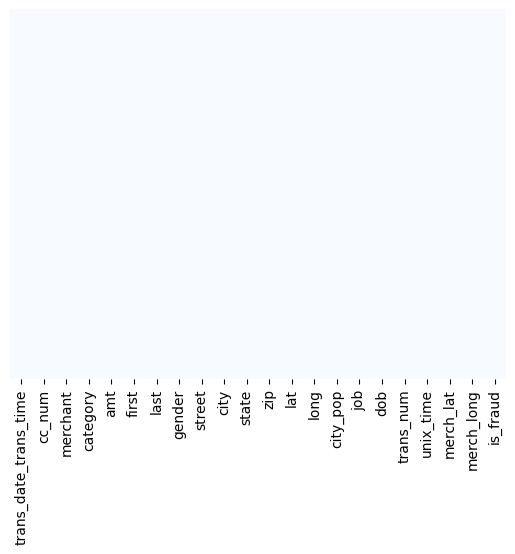

In [ ]:
sns.heatmap(bcfd.isnull(),yticklabels=False,cbar=False,cmap='Blues')

In [ ]:
!pip install missingno

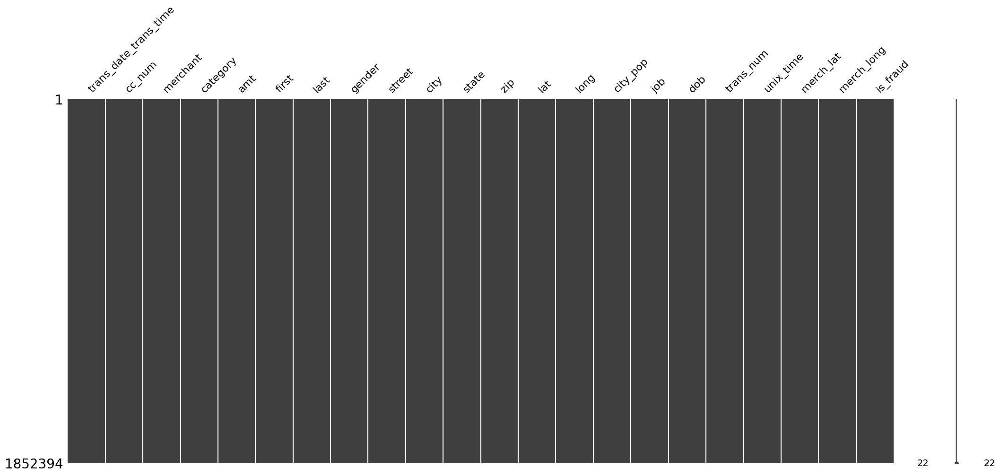

In [ ]:
import missingno as msno
msno.matrix(bcfd);

**EDA :)**

array([[<Axes: title={'center': 'cc_num'}>,
        <Axes: title={'center': 'amt'}>, <Axes: title={'center': 'zip'}>],
       [<Axes: title={'center': 'lat'}>,
        <Axes: title={'center': 'long'}>,
        <Axes: title={'center': 'city_pop'}>],
       [<Axes: title={'center': 'unix_time'}>,
        <Axes: title={'center': 'merch_lat'}>,
        <Axes: title={'center': 'merch_long'}>],
       [<Axes: title={'center': 'is_fraud'}>, <Axes: >, <Axes: >]],
      dtype=object)

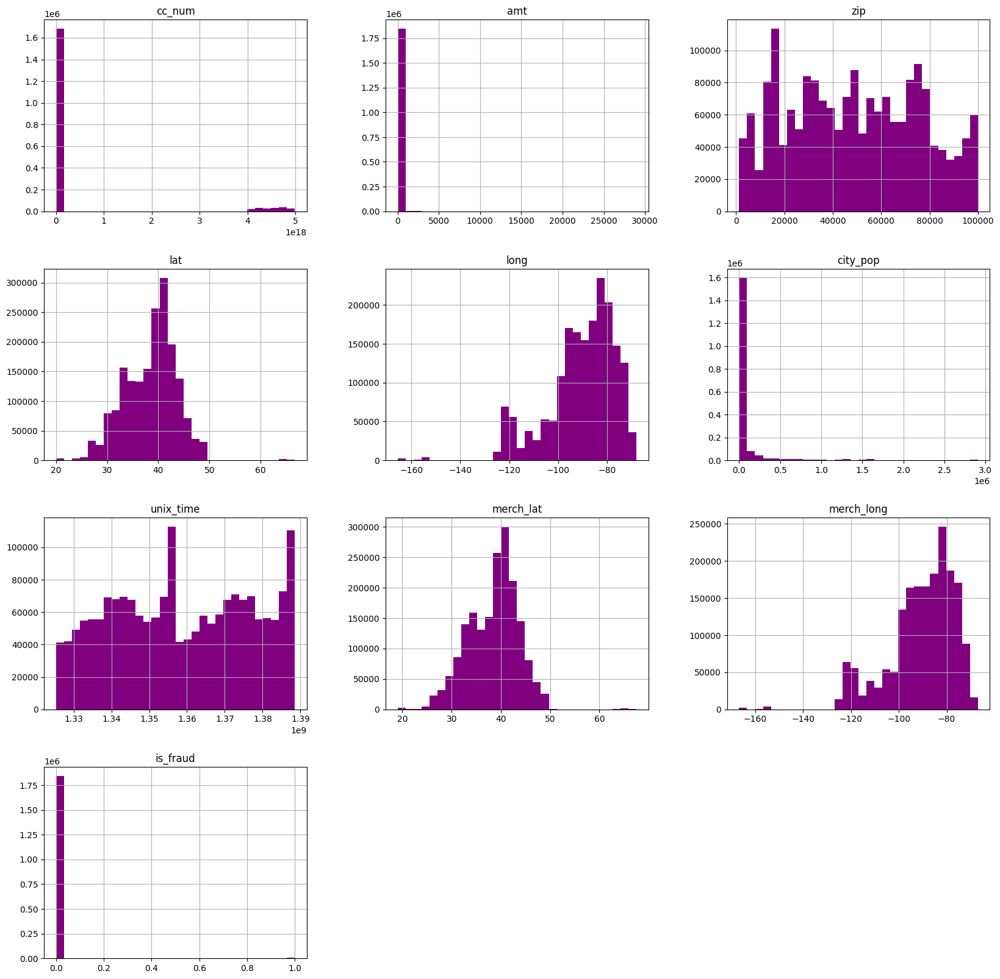

In [ ]:
bcfd.hist(bins=30,figsize=(20,20),color= 'purple')

<Axes: xlabel='is_fraud'>

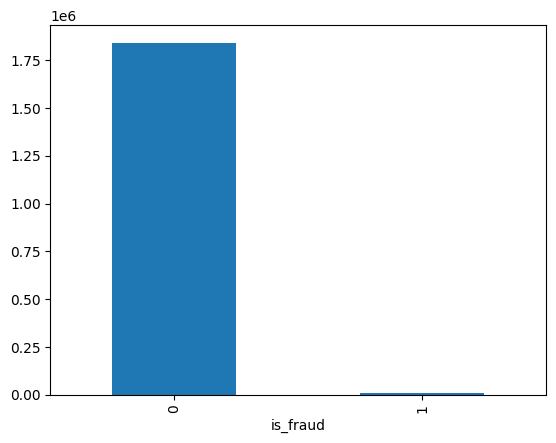

In [ ]:
bcfd.groupby('is_fraud').count()['cc_num'].plot.bar()

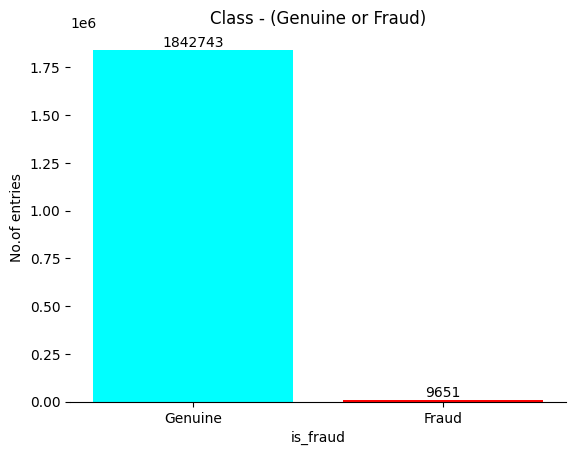

In [ ]:
class_counts =bcfd["is_fraud"].value_counts()
bar_colors = ["cyan", "red"]
plt.bar(class_counts.index, class_counts.values, color = bar_colors)

plt.xlabel("is_fraud")
plt.ylabel("No.of entries")
plt.title("Class - (Genuine or Fraud)")

for _, value in enumerate(class_counts.values):
  plt.text(class_counts.index[_], value, str(value), ha="center", va= "bottom")

class_labels = {0: "Genuine", 1: "Fraud"}
plt.xticks(class_counts.index, [class_labels[x] for x in class_counts.index])

plt.gca().spines["top"].set_visible(False)
plt.gca().spines["right"].set_visible(False)
plt.gca().spines["left"].set_visible(False)

plt.show()

In [ ]:
Fraud = bcfd[bcfd['is_fraud'] == 1]
Genuine= bcfd[bcfd['is_fraud'] == 0]

print(len(Fraud), len(Genuine))

9651 1842743


Class as pie chart:


Text(0, 0.5, '')

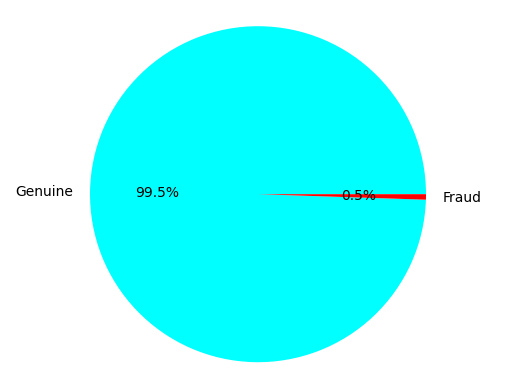

In [ ]:
print("Class as pie chart:")
fig, ax = plt.subplots(1, 1)
ax.pie(bcfd.is_fraud.value_counts(),autopct='%1.1f%%', labels=['Genuine','Fraud'], colors=['cyan','r'])
plt.axis('equal')
plt.ylabel('')

**Categorical Variable Analysis :)**

In [ ]:
total = pd.concat([bcfd_train, bcfd_test])
print(total.info())

total["is_fraud_cat"]=total.is_fraud.apply(lambda x: "T" if x==1 else "F")
total["is_fraud_cat"].astype("object")

totalcat=total.select_dtypes(include=['object'])

total[totalcat.columns]

<class 'pandas.core.frame.DataFrame'>
Index: 1852394 entries, 0 to 555718
Data columns (total 22 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   trans_date_trans_time  object 
 1   cc_num                 int64  
 2   merchant               object 
 3   category               object 
 4   amt                    float64
 5   first                  object 
 6   last                   object 
 7   gender                 object 
 8   street                 object 
 9   city                   object 
 10  state                  object 
 11  zip                    int64  
 12  lat                    float64
 13  long                   float64
 14  city_pop               int64  
 15  job                    object 
 16  dob                    object 
 17  trans_num              object 
 18  unix_time              int64  
 19  merch_lat              float64
 20  merch_long             float64
 21  is_fraud               int64  
dtypes: float64(5), int64(5),

,trans_date_trans_time,merchant,category,first,last,gender,street,city,state,job,dob,trans_num,is_fraud_cat
0,2019-01-01 00:00:18,"fraud_Rippin, Kub and Mann",misc_net,Jennifer,Banks,F,561 Perry Cove,Moravian Falls,NC,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,F
1,2019-01-01 00:00:44,"fraud_Heller, Gutmann and Zieme",grocery_pos,Stephanie,Gill,F,43039 Riley Greens Suite 393,Orient,WA,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,F
2,2019-01-01 00:00:51,fraud_Lind-Buckridge,entertainment,Edward,Sanchez,M,594 White Dale Suite 530,Malad City,ID,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,F
3,2019-01-01 00:01:16,"fraud_Kutch, Hermiston and Farrell",gas_transport,Jeremy,White,M,9443 Cynthia Court Apt. 038,Boulder,MT,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,F
4,2019-01-01 00:03:06,fraud_Keeling-Crist,misc_pos,Tyler,Garcia,M,408 Bradley Rest,Doe Hill,VA,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,F
...,...,...,...,...,...,...,...,...,...,...,...,...,...
555714,2020-12-31 23:59:07,fraud_Reilly and Sons,health_fitness,Michael,Olson,M,558 Michael Estates,Luray,MO,Town planner,1966-02-13,9b1f753c79894c9f4b71f04581835ada,F
555715,2020-12-31 23:59:09,fraud_Hoppe-Parisian,kids_pets,Jose,Vasquez,M,572 Davis Mountains,Lake Jackson,TX,Futures trader,1999-12-27,2090647dac2c89a1d86c514c427f5b91,F
555716,2020-12-31 23:59:15,fraud_Rau-Robel,kids_pets,Ann,Lawson,F,144 Evans Islands Apt. 683,Burbank,WA,Musician,1981-11-29,6c5b7c8add471975aa0fec023b2e8408,F
555717,2020-12-31 23:59:24,fraud_Breitenberg LLC,travel,Eric,Preston,M,7020 Doyle Stream Apt. 951,Mesa,ID,Cartographer,1965-12-15,14392d723bb7737606b2700ac791b7aa,F


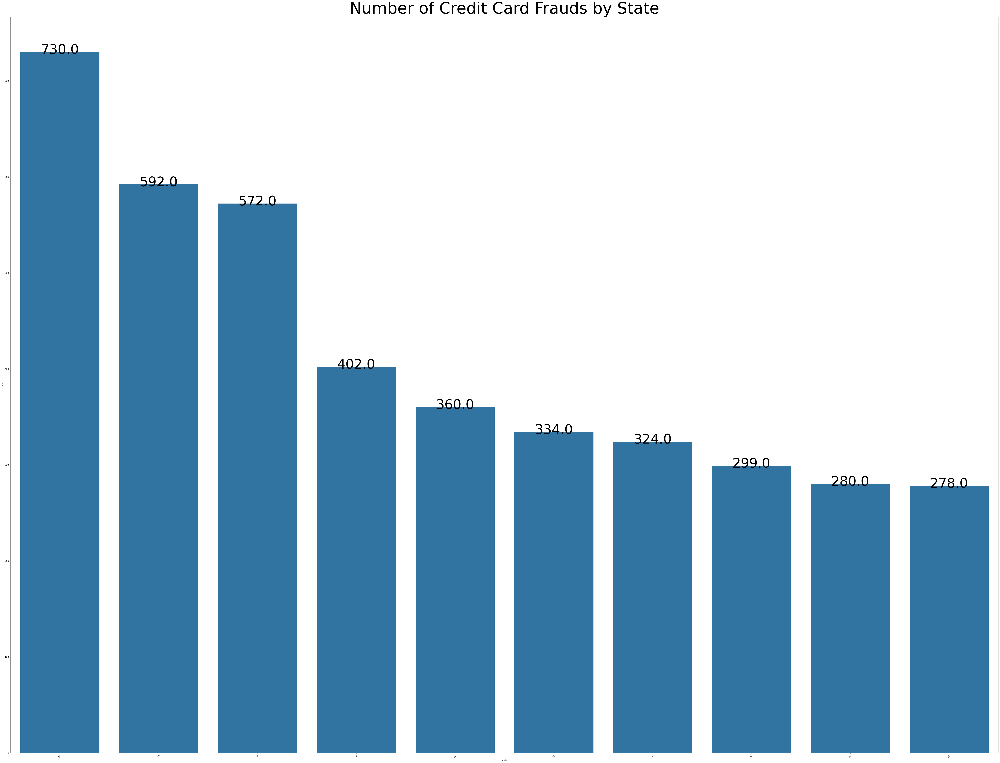

In [ ]:
fraud_data = total[total['is_fraud_cat'] == "T"]

# Calculate the count of frauds by state and get the top 10 states
top_states = fraud_data['state'].value_counts().head(10).index

# Filter the fraud_data to include only the top 10 states
top_fraud_data = fraud_data[fraud_data['state'].isin(top_states)]

# Now create the count plot for only the top 10 states
fig, ax = plt.subplots(figsize=(80, 60))
plt.rcParams.update({'font.size': 60})

# Use the filtered top_fraud_data for plotting
sns.countplot(x='state', data=top_fraud_data, order=top_states)

plt.xticks(rotation=45)

# Annotate the bars with the count of frauds
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.1f'),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center',
                xytext = (0, 9),
                textcoords = 'offset points')

plt.title("Number of Credit Card Frauds by State")
plt.savefig('fraud_by_state.pdf', bbox_inches='tight', dpi=300)
plt.show()

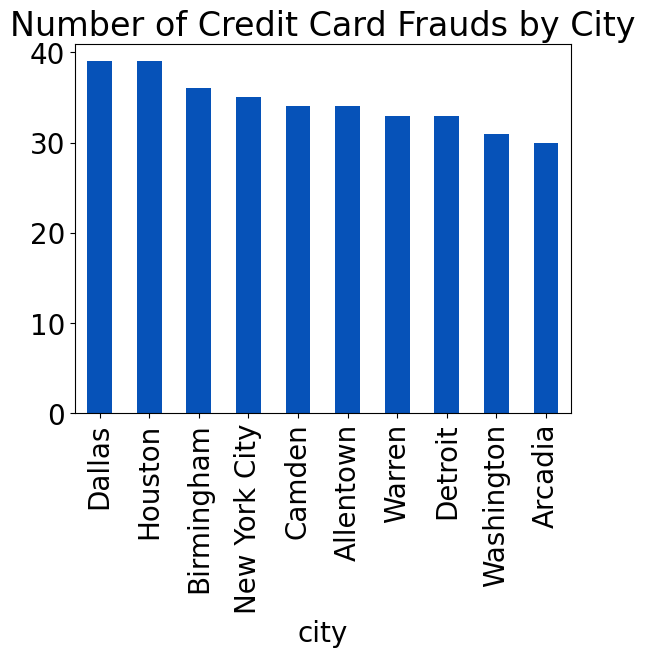

In [ ]:
import random
def randomcolor():
    r = random.random()
    b = random.random()
    g = random.random()
    rgb = [r,g,b]
    return rgb
plt.rcParams.update({'font.size': 20})
total[total['is_fraud_cat']=="T"]["city"].value_counts(sort=True,ascending=False).head(10).plot(kind="bar",color=randomcolor())
plt.title("Number of Credit Card Frauds by City")

plt.show()

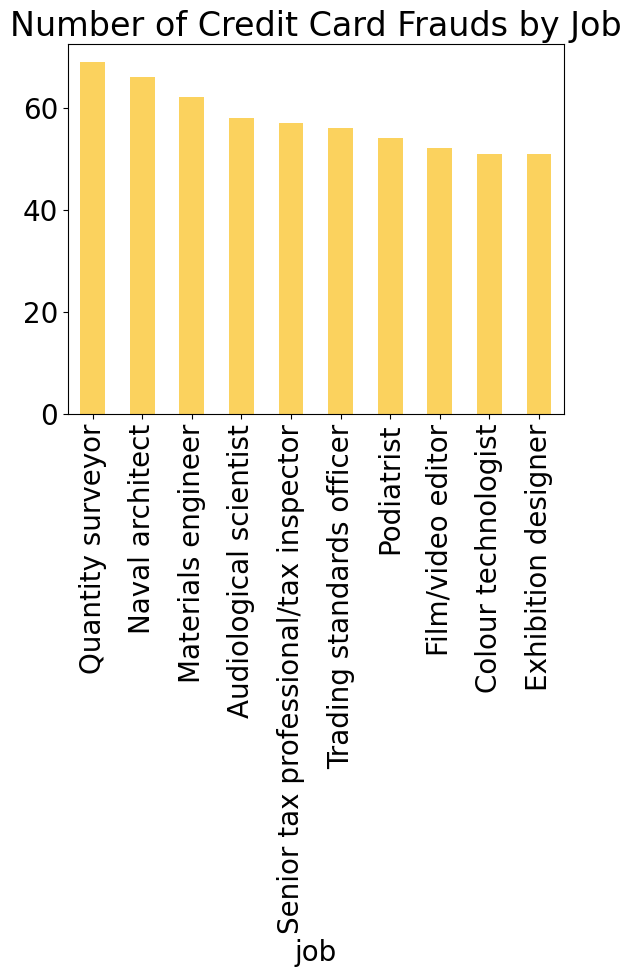

In [ ]:
total[total['is_fraud_cat']=="T"]["job"].value_counts(sort=True,ascending=False).head(10).plot(kind="bar",color=randomcolor())
plt.title("Number of Credit Card Frauds by Job")

plt.show()

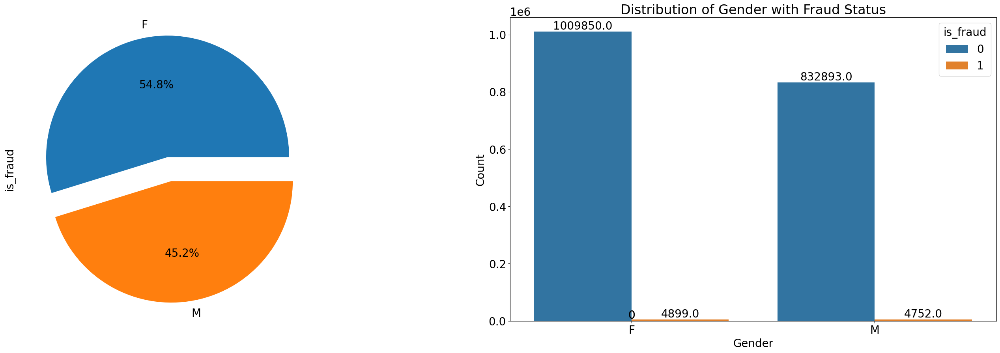

In [ ]:
fig,axb = plt.subplots(ncols=2,nrows=1,figsize=(35, 10))

#Gender Distribution
explode = [0.1, 0.1]
bcfd.groupby('gender')['is_fraud'].count().plot.pie(explode=explode, autopct="%1.1f%%",ax=axb[0]);

ax = sns.countplot(x="gender", hue="is_fraud", data=bcfd,ax=axb[1])

# Add values on top of each bar
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points')

# Set labels and title
plt.title("Distribution of Gender with Fraud Status")
plt.xlabel("Gender")
plt.ylabel("Count")

# Show the plot
plt.show()

observation: Frauds in Female transaction are more than Males transaction

In [ ]:
bcfd['trans_date_trans_time'] = pd.to_datetime(bcfd['trans_date_trans_time'])

In [ ]:
bcfd['hour'] = bcfd['trans_date_trans_time'].dt.hour
bcfd['hour'] = bcfd['trans_date_trans_time'].dt.hour

bcfd['month'] =bcfd['trans_date_trans_time'].dt.month
bcfd['month'] = bcfd['trans_date_trans_time'].dt.month

In [ ]:
import datetime as dt
bcfd['age'] = dt.date.today().year-pd.to_datetime(bcfd['dob']).dt.year

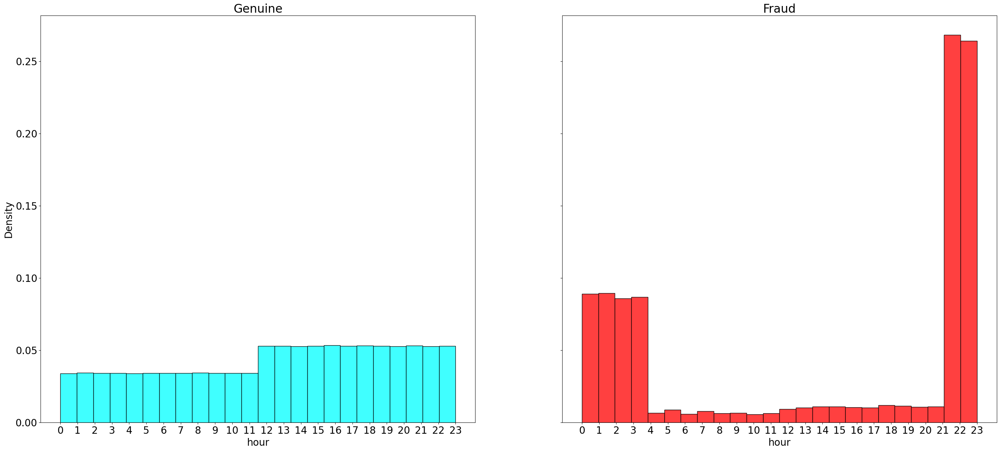

In [ ]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(35,15), sharey=True)

ax1 = sns.histplot(x='hour', data=bcfd[bcfd["is_fraud"] == 0],
                   stat="density", bins=24, ax=ax1, color="cyan")

ax2 = sns.histplot(x='hour', data=bcfd[bcfd["is_fraud"] == 1],
                   stat="density", bins=24, ax=ax2, color="red")

ax1.set_title("Genuine")
ax2.set_title("Fraud")

ax1.set_xticks(np.arange(24)) # ticks of the day 0 -> 23
ax2.set_xticks(np.arange(24));

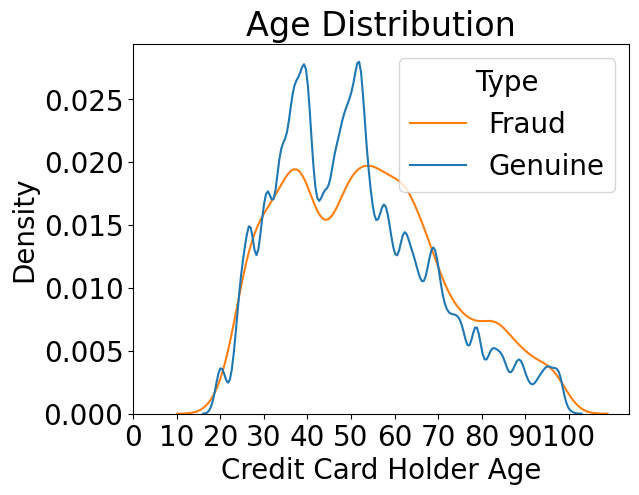

In [ ]:
import datetime as dt
bcfd['age'] = dt.date.today().year-pd.to_datetime(bcfd['dob']).dt.year
ax = sns.kdeplot(x='age', data=bcfd, hue='is_fraud', common_norm=False)
ax.set_xlabel('Credit Card Holder Age')
ax.set_ylabel('Density')
plt.xticks(np.arange(0, 110, 10))
plt.title('Age Distribution')
plt.legend(title='Type', labels=['Fraud', 'Genuine']);

<Axes: >

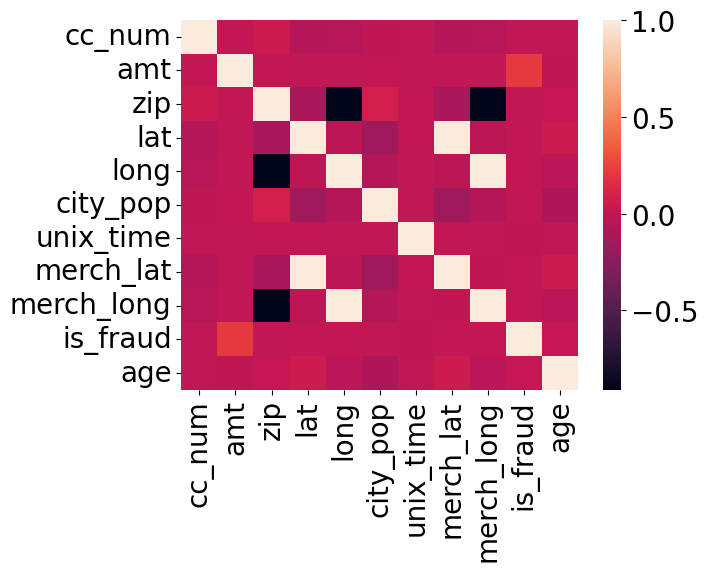

In [ ]:
sns.heatmap(bcfd[[i for i in bcfd.columns\
                         if bcfd[i].dtype == 'int64' \
                            or bcfd[i].dtype == 'float64']]\
                            .corr())

In [ ]:
fraud_percentage = (bcfd["is_fraud"].value_counts(normalize=True) *100).loc[1]
print(f"The percentage of entries classfied as fraud is {fraud_percentage:.4f}%.")

The percentage of entries classfied as fraud is 0.5210%.


In [ ]:
unique_transaction_count = len(bcfd['trans_num'].unique())
print("Total count of unique transaction numbers:", unique_transaction_count)

Total count of unique transaction numbers: 1852394


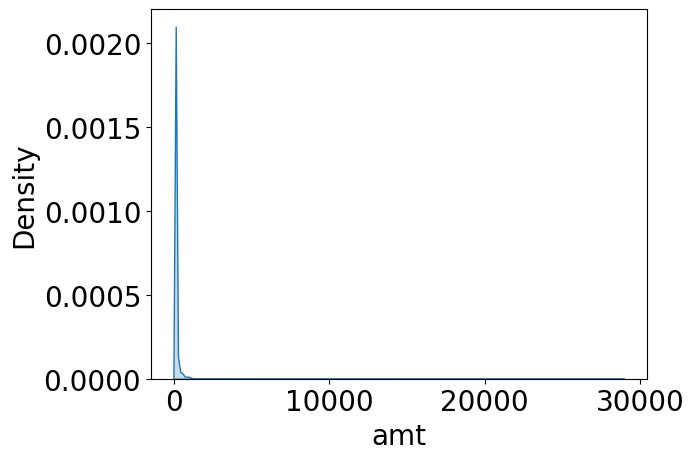

In [ ]:
sns.kdeplot(bcfd["amt"], fill=True);

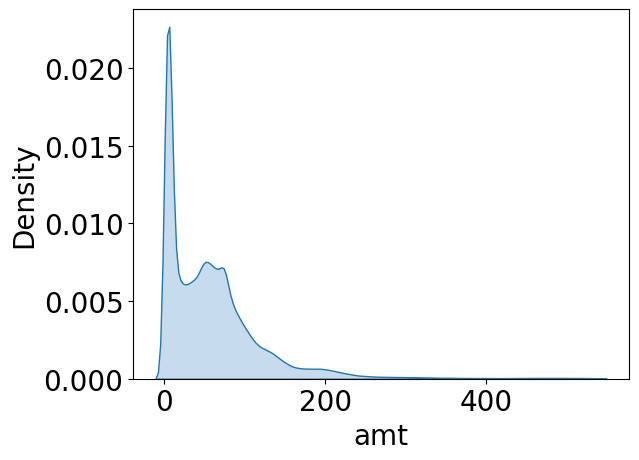

In [ ]:
p99 = bcfd["amt"].quantile(0.99)
sns.kdeplot(x="amt", data=bcfd[bcfd["amt"] <= p99], fill=True);

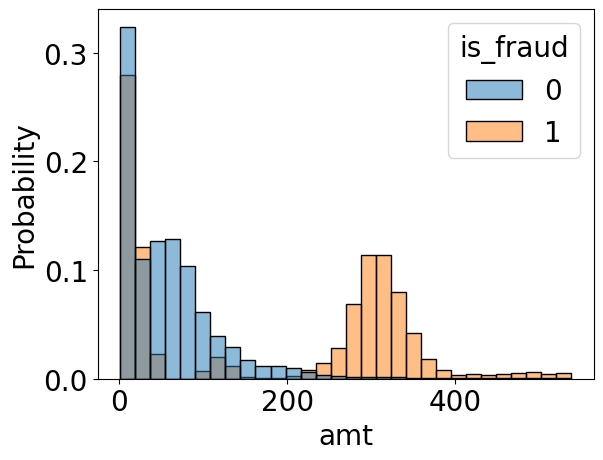

In [ ]:
p99 = bcfd["amt"].quantile(0.99)
sns.histplot(x="amt", hue="is_fraud", bins=30,
             stat="probability", data=bcfd[bcfd["amt"] <= p99],
             common_norm=False);

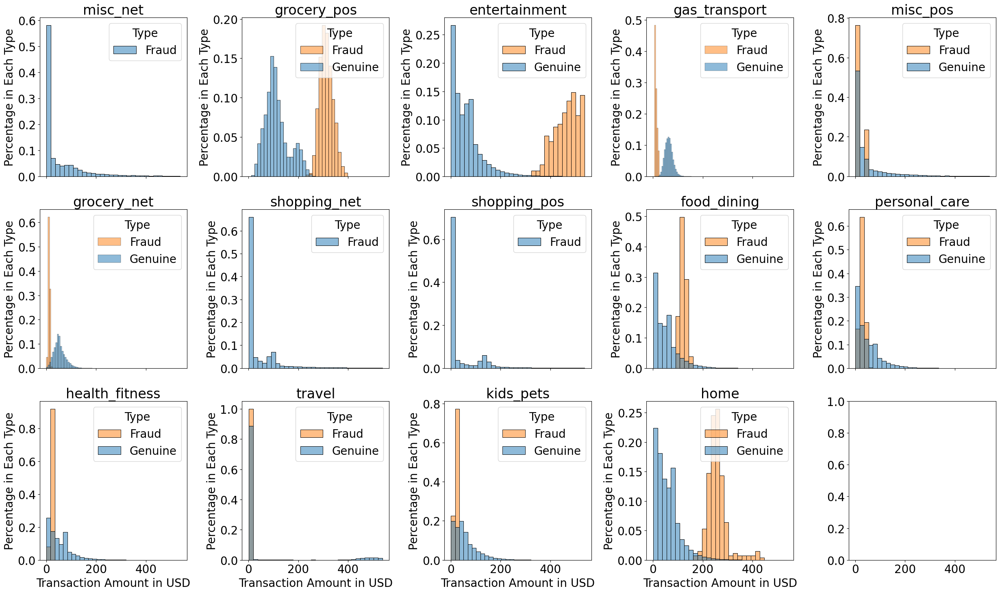

In [ ]:
categories = bcfd['category'].unique()

num_plots = len(categories)
num_rows = math.isqrt(num_plots)
num_cols = math.ceil(num_plots / num_rows)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(
    5*num_cols, 5*num_rows), sharex=True)

for i, category in enumerate(categories):

    row = i // num_cols
    col = i % num_cols

    data_category = bcfd[bcfd['category'] == category]

    if num_rows == 1 and num_cols == 1:
        ax = axes
    elif num_rows == 1 or num_cols == 1:
        ax = axes[i]
    else:
        ax = axes[row, col]

    sns.histplot(x='amt', data=data_category[data_category['amt'] <= p99],
                 hue='is_fraud', stat='probability',
                 common_norm=False, bins=30, ax=ax)

    ax.set_ylabel('Percentage in Each Type')
    ax.set_xlabel('Transaction Amount in USD')
    ax.set_title(f'{category}')
    ax.legend(title='Type', labels=['Fraud', 'Genuine'])

plt.tight_layout()

plt.show();

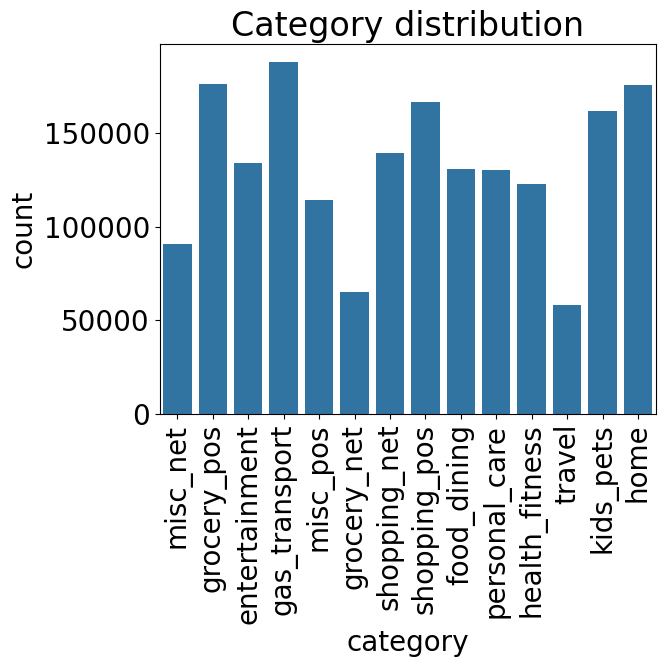

In [ ]:
sns.countplot(x='category', data=bcfd)
plt.title('Category distribution')
plt.xticks(rotation=90)
plt.show()

observation: higest transaction are fgor gas tarnsaction that is over 1,75,000

In [ ]:
# Genuine
Genuine = bcfd[bcfd['is_fraud'] == 0]['category'].value_counts(
    normalize=True).to_frame().reset_index()
Genuine.columns = ['category', 'not_fraud_percentual_vs_total']

# fraud
Fraud = bcfd[bcfd['is_fraud'] == 1]['category'].value_counts(
    normalize=True).to_frame().reset_index()
Fraud.columns = ['category', 'fraud_percentage_vs_total']

# merging two dataframes and calculating "fraud level"
Genuine_vs_Fraud = Genuine.merge(Fraud, on='category')
Genuine_vs_Fraud['fraud_level'] = Genuine_vs_Fraud['fraud_percentage_vs_total'] - \
    Genuine_vs_Fraud['not_fraud_percentual_vs_total']

Genuine_vs_Fraud

,category,not_fraud_percentual_vs_total,fraud_percentage_vs_total,fraud_level
0,gas_transport,0.101619,0.079992,-0.021627
1,home,0.095073,0.027458,-0.067615
2,grocery_pos,0.094404,0.230857,0.136453
3,shopping_pos,0.089761,0.109419,0.019657
4,kids_pets,0.087599,0.031499,-0.056100
5,shopping_net,0.074402,0.229924,0.155523
6,entertainment,0.072623,0.030256,-0.042367
7,food_dining,0.070831,0.021241,-0.049590
8,personal_care,0.070436,0.030049,-0.040387
9,health_fitness,0.066405,0.019169,-0.047236


<ipython-input-48-a8f5dbd2b124>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(y='category', x='fraud_level',
<ipython-input-48-a8f5dbd2b124>:2: UserWarning: 
The palette list has fewer values (6) than needed (14) and will cycle, which may produce an uninterpretable plot.
  ax = sns.barplot(y='category', x='fraud_level',


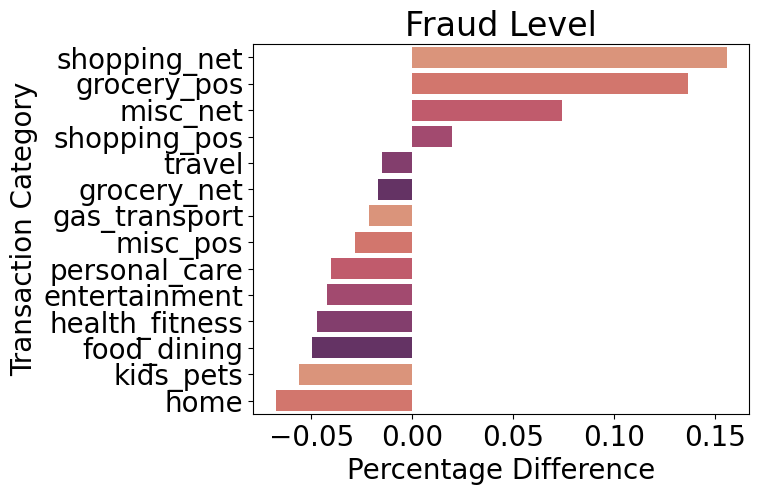

In [ ]:
custom_palette = sns.color_palette("flare")
ax = sns.barplot(y='category', x='fraud_level',
                 data=Genuine_vs_Fraud.sort_values('fraud_level', ascending=False), palette=custom_palette)
ax.set_xlabel('Percentage Difference')
ax.set_ylabel('Transaction Category')
plt.title('Fraud Level');

**Data Preprocessing :)**

In [ ]:
pd.DataFrame(bcfd.isnull().value_counts())

,,,,,,,,,,,,,,,,,,,,,,,,,count
trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,hour,month,age,
False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,1852394


In [ ]:
bcfd.columns

Index(['trans_date_trans_time', 'cc_num', 'merchant', 'category', 'amt',
       'first', 'last', 'gender', 'street', 'city', 'state', 'zip', 'lat',
       'long', 'city_pop', 'job', 'dob', 'trans_num', 'unix_time', 'merch_lat',
       'merch_long', 'is_fraud', 'hour', 'month', 'age'],
      dtype='object')

In [ ]:
# remove non-useful columns
c_drop = ['unix_time', 'zip', 'city','street', 'state', 'trans_num', 'trans_date_trans_time','job','city_pop','dob']
bcfd_dp= bcfd.drop(c_drop, axis=1)

bcfd_dp.head(5)

,cc_num,merchant,category,amt,first,last,gender,lat,long,merch_lat,merch_long,is_fraud,hour,month,age
0,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,36.0788,-81.1781,36.011293,-82.048315,0,0,1,36
1,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,48.8878,-118.2105,49.159047,-118.186462,0,0,1,46
2,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,42.1808,-112.2620,43.150704,-112.154481,0,0,1,62
3,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,46.2306,-112.1138,47.034331,-112.561071,0,0,1,57
4,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,38.4207,-79.4629,38.674999,-78.632459,0,0,1,38


In [ ]:
#clean merchant column
bcfd_dp['merchant'] = bcfd_dp['merchant'].apply(lambda x : x.replace('fraud_',''))
bcfd_dp

,cc_num,merchant,category,amt,first,last,gender,lat,long,merch_lat,merch_long,is_fraud,hour,month,age
0,2703186189652095,"Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,36.0788,-81.1781,36.011293,-82.048315,0,0,1,36
1,630423337322,"Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,48.8878,-118.2105,49.159047,-118.186462,0,0,1,46
2,38859492057661,Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,42.1808,-112.2620,43.150704,-112.154481,0,0,1,62
3,3534093764340240,"Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,46.2306,-112.1138,47.034331,-112.561071,0,0,1,57
4,375534208663984,Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,38.4207,-79.4629,38.674999,-78.632459,0,0,1,38
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
555714,30560609640617,Reilly and Sons,health_fitness,43.77,Michael,Olson,M,40.4931,-91.8912,39.946837,-91.333331,0,23,12,58
555715,3556613125071656,Hoppe-Parisian,kids_pets,111.84,Jose,Vasquez,M,29.0393,-95.4401,29.661049,-96.186633,0,23,12,25
555716,6011724471098086,Rau-Robel,kids_pets,86.88,Ann,Lawson,F,46.1966,-118.9017,46.658340,-119.715054,0,23,12,43
555717,4079773899158,Breitenberg LLC,travel,7.99,Eric,Preston,M,44.6255,-116.4493,44.470525,-117.080888,0,23,12,59


In [ ]:
bcfd_dp.describe(include='object')

,merchant,category,first,last,gender
count,1852394,1852394,1852394,1852394,1852394
unique,693,14,355,486,2
top,Kilback LLC,gas_transport,Christopher,Smith,F
freq,6262,188029,38112,40940,1014749


In [ ]:
bcfd_dp.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1852394 entries, 0 to 555718
Data columns (total 15 columns):
 #   Column      Dtype  
---  ------      -----  
 0   cc_num      int64  
 1   merchant    object 
 2   category    object 
 3   amt         float64
 4   first       object 
 5   last        object 
 6   gender      object 
 7   lat         float64
 8   long        float64
 9   merch_lat   float64
 10  merch_long  float64
 11  is_fraud    int64  
 12  hour        int32  
 13  month       int32  
 14  age         int64  
dtypes: float64(5), int32(2), int64(3), object(5)
memory usage: 244.2+ MB


# **Data Encoding And Scaling :)**
**WOEEncoder**

In [ ]:
bcfd_dp.columns

Index(['cc_num', 'merchant', 'category', 'amt', 'first', 'last', 'gender',
       'lat', 'long', 'merch_lat', 'merch_long', 'is_fraud', 'hour', 'month',
       'age'],
      dtype='object')

In [ ]:
# bcfd_dp['gender'] = bcfd_dp['gender'].map({'F': 0, 'M': 1})
def gender_binarizer(x):
    if x=='F':
        return 0
    if x=='M':
        return 1

bcfd_dp['gender'] = bcfd_dp['gender'].transform(gender_binarizer)

In [ ]:
bcfd_dp

,cc_num,merchant,category,amt,first,last,gender,lat,long,merch_lat,merch_long,is_fraud,hour,month,age
0,2703186189652095,"Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,0,36.0788,-81.1781,36.011293,-82.048315,0,0,1,36
1,630423337322,"Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,0,48.8878,-118.2105,49.159047,-118.186462,0,0,1,46
2,38859492057661,Lind-Buckridge,entertainment,220.11,Edward,Sanchez,1,42.1808,-112.2620,43.150704,-112.154481,0,0,1,62
3,3534093764340240,"Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,1,46.2306,-112.1138,47.034331,-112.561071,0,0,1,57
4,375534208663984,Keeling-Crist,misc_pos,41.96,Tyler,Garcia,1,38.4207,-79.4629,38.674999,-78.632459,0,0,1,38
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
555714,30560609640617,Reilly and Sons,health_fitness,43.77,Michael,Olson,1,40.4931,-91.8912,39.946837,-91.333331,0,23,12,58
555715,3556613125071656,Hoppe-Parisian,kids_pets,111.84,Jose,Vasquez,1,29.0393,-95.4401,29.661049,-96.186633,0,23,12,25
555716,6011724471098086,Rau-Robel,kids_pets,86.88,Ann,Lawson,0,46.1966,-118.9017,46.658340,-119.715054,0,23,12,43
555717,4079773899158,Breitenberg LLC,travel,7.99,Eric,Preston,1,44.6255,-116.4493,44.470525,-117.080888,0,23,12,59


In [ ]:
!pip install category_encoders

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 2.4 MB/s eta 0:00:00


In [ ]:
from category_encoders import WOEEncoder


In [ ]:
bcfd_dp

,cc_num,merchant,category,amt,first,last,gender,lat,long,merch_lat,merch_long,is_fraud,hour,month,age
0,2703186189652095,"Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,0,36.0788,-81.1781,36.011293,-82.048315,0,0,1,36
1,630423337322,"Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,0,48.8878,-118.2105,49.159047,-118.186462,0,0,1,46
2,38859492057661,Lind-Buckridge,entertainment,220.11,Edward,Sanchez,1,42.1808,-112.2620,43.150704,-112.154481,0,0,1,62
3,3534093764340240,"Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,1,46.2306,-112.1138,47.034331,-112.561071,0,0,1,57
4,375534208663984,Keeling-Crist,misc_pos,41.96,Tyler,Garcia,1,38.4207,-79.4629,38.674999,-78.632459,0,0,1,38
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
555714,30560609640617,Reilly and Sons,health_fitness,43.77,Michael,Olson,1,40.4931,-91.8912,39.946837,-91.333331,0,23,12,58
555715,3556613125071656,Hoppe-Parisian,kids_pets,111.84,Jose,Vasquez,1,29.0393,-95.4401,29.661049,-96.186633,0,23,12,25
555716,6011724471098086,Rau-Robel,kids_pets,86.88,Ann,Lawson,0,46.1966,-118.9017,46.658340,-119.715054,0,23,12,43
555717,4079773899158,Breitenberg LLC,travel,7.99,Eric,Preston,1,44.6255,-116.4493,44.470525,-117.080888,0,23,12,59


In [ ]:
# applying WOE encoding
for col in [ 'merchant', 'category', 'first', 'last']:
       bcfd_dp[col] = WOEEncoder().fit_transform(bcfd_dp[col],bcfd_dp['is_fraud'])

In [ ]:
bcfd_dp

,cc_num,merchant,category,amt,first,last,gender,lat,long,merch_lat,merch_long,is_fraud,hour,month,age
0,2703186189652095,1.006109,0.925860,4.97,0.134123,-0.241661,0,36.0788,-81.1781,36.011293,-82.048315,0,0,1,36
1,630423337322,0.676459,0.894448,107.23,0.036022,-0.354978,0,48.8878,-118.2105,49.159047,-118.186462,0,0,1,46
2,38859492057661,-0.834274,-0.872388,220.11,0.165290,0.285653,1,42.1808,-112.2620,43.150704,-112.154481,0,0,1,62
3,3534093764340240,-0.666344,-0.238221,45.00,0.339284,0.312353,1,46.2306,-112.1138,47.034331,-112.561071,0,0,1,57
4,375534208663984,-0.402499,-0.613751,41.96,-0.165204,0.470864,1,38.4207,-79.4629,38.674999,-78.632459,0,0,1,38
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
555714,30560609640617,-0.599638,-1.237307,43.77,0.008551,-0.186336,1,40.4931,-91.8912,39.946837,-91.333331,0,23,12,58
555715,3556613125071656,-0.898860,-1.019735,111.84,0.505896,0.532329,1,29.0393,-95.4401,29.661049,-96.186633,0,23,12,25
555716,6011724471098086,-0.900078,-1.019735,86.88,-0.869927,-0.869927,0,46.1966,-118.9017,46.658340,-119.715054,0,23,12,43
555717,4079773899158,-0.404249,-0.656773,7.99,0.607077,0.012154,1,44.6255,-116.4493,44.470525,-117.080888,0,23,12,59


In [ ]:
bcfd_dp.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1852394 entries, 0 to 555718
Data columns (total 15 columns):
 #   Column      Dtype  
---  ------      -----  
 0   cc_num      int64  
 1   merchant    float64
 2   category    float64
 3   amt         float64
 4   first       float64
 5   last        float64
 6   gender      int64  
 7   lat         float64
 8   long        float64
 9   merch_lat   float64
 10  merch_long  float64
 11  is_fraud    int64  
 12  hour        int32  
 13  month       int32  
 14  age         int64  
dtypes: float64(9), int32(2), int64(4)
memory usage: 244.2 MB


In [ ]:
bcfd_dp

,cc_num,merchant,category,amt,first,last,gender,lat,long,merch_lat,merch_long,is_fraud,hour,month,age
0,2703186189652095,1.006109,0.925860,4.97,0.134123,-0.241661,0,36.0788,-81.1781,36.011293,-82.048315,0,0,1,36
1,630423337322,0.676459,0.894448,107.23,0.036022,-0.354978,0,48.8878,-118.2105,49.159047,-118.186462,0,0,1,46
2,38859492057661,-0.834274,-0.872388,220.11,0.165290,0.285653,1,42.1808,-112.2620,43.150704,-112.154481,0,0,1,62
3,3534093764340240,-0.666344,-0.238221,45.00,0.339284,0.312353,1,46.2306,-112.1138,47.034331,-112.561071,0,0,1,57
4,375534208663984,-0.402499,-0.613751,41.96,-0.165204,0.470864,1,38.4207,-79.4629,38.674999,-78.632459,0,0,1,38
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
555714,30560609640617,-0.599638,-1.237307,43.77,0.008551,-0.186336,1,40.4931,-91.8912,39.946837,-91.333331,0,23,12,58
555715,3556613125071656,-0.898860,-1.019735,111.84,0.505896,0.532329,1,29.0393,-95.4401,29.661049,-96.186633,0,23,12,25
555716,6011724471098086,-0.900078,-1.019735,86.88,-0.869927,-0.869927,0,46.1966,-118.9017,46.658340,-119.715054,0,23,12,43
555717,4079773899158,-0.404249,-0.656773,7.99,0.607077,0.012154,1,44.6255,-116.4493,44.470525,-117.080888,0,23,12,59


In [ ]:
X = bcfd_dp.drop(['is_fraud'],axis=1)
y = bcfd_dp['is_fraud']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
from sklearn.preprocessing import RobustScaler

In [ ]:

scaler = RobustScaler()

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)



In [ ]:
X_train

array([[ 0.6700559 ,  1.01390043,  1.27189344, ..., -0.58333333,
        -0.16666667,  1.16      ],
       [ 0.01001238,  0.90696515,  1.46398473, ...,  0.41666667,
         0.33333333,  0.16      ],
       [ 0.01156662,  0.3636793 ,  0.34233204, ..., -0.75      ,
        -0.83333333, -0.6       ],
       ...,
       [ 0.0138668 , -0.67862285, -0.47851556, ...,  0.58333333,
        -0.66666667, -0.12      ],
       [-0.78240863,  0.61159932,  0.7009566 , ..., -0.41666667,
         0.5       ,  1.32      ],
       [-0.78052912, -0.2047791 , -0.15863938, ...,  0.33333333,
        -0.66666667, -0.56      ]])

In [ ]:
X_test

array([[ 0.41193164,  0.35961807,  0.34233204, ..., -0.58333333,
         0.33333333,  0.        ],
       [ 0.45251531,  0.41174414,  0.7009566 , ...,  0.25      ,
         0.83333333, -0.4       ],
       [-0.17940045,  0.23246793,  0.34233204, ..., -0.25      ,
        -0.16666667,  1.92      ],
       ...,
       [-0.78822307, -0.04428211,  0.34233204, ..., -1.08333333,
         0.5       ,  0.16      ],
       [ 0.18882864,  1.31213965,  1.46398473, ...,  0.16666667,
         0.83333333, -0.88      ],
       [-0.74880407, -0.69432871, -0.47851556, ...,  0.5       ,
         0.66666667,  0.12      ]])

# **EXTREME GRADIANT BOOSTING(XGBOOST) :)**

In [ ]:
xgb_model=xgb.XGBClassifier().fit(X_train, y_train)

In [ ]:
train_preds = xgb_model.predict(X_train)
#accuracy on train
print("Model accuracy on train is: ", accuracy_score(y_train, train_preds))
#predict on test
test_preds = xgb_model.predict(X_test)
#accuracy on test
print("Model accuracy on test is: ", accuracy_score(y_test, test_preds))
print('-'*50)

Model accuracy on train is:  0.9992239770837059
Model accuracy on test is:  0.9988825277546096
--------------------------------------------------


In [ ]:
train_preds =xgb_model.predict(X_train)
print("Model precision on train is: ", precision_score(y_train, train_preds))
#predict on test
test_preds =xgb_model.predict(X_test)
#precisionon test
print("Model precision on test is: ", precision_score(y_test, test_preds))
print('-'*50)

Model precision on train is:  0.9811875367430923
Model precision on test is:  0.9523809523809523
--------------------------------------------------


In [ ]:
train_preds =xgb_model.predict(X_train)
print("Model recall on train is: ", recall_score(y_train, train_preds))
#predict on test
test_preds =xgb_model.predict(X_test)
#recall_score on test
print("Model recall on test is: ", recall_score(y_test, test_preds))
print('-'*50)

Model recall on train is:  0.8672382436996623
Model recall on test is:  0.8294930875576036
--------------------------------------------------


In [ ]:
train_preds =xgb_model.predict(X_train)
print("Model f1_score on train is: ",f1_score(y_train, train_preds))
#predict on test
test_preds =xgb_model.predict(X_test)
# f1_score on test
print("Model f1_score on test is: ", f1_score(y_test, test_preds))
print('-'*50)

Model f1_score on train is:  0.9207005930216523
Model f1_score on test is:  0.8866995073891625
--------------------------------------------------


In [ ]:
#We got good accuracy which means our model is performing quite well
#ROC
print("ROC score on train is: ", roc_auc_score(y_train, train_preds))
print("ROC score on test is: ", roc_auc_score(y_test, test_preds))
print('-'*50)

#Confusion matrix
print("confusion_matrix train is: ", confusion_matrix(y_train, train_preds))
print("confusion_matrix test is: ", confusion_matrix(y_test, test_preds))

print('-'*50)

ROC score on train is:  0.9335757089737077
ROC score on test is:  0.9146366465123946
--------------------------------------------------
confusion_matrix train is:  [[1474089     128]
 [   1022    6676]]
confusion_matrix test is:  [[368445     81]
 [   333   1620]]
--------------------------------------------------


In [ ]:
!pip install scikit-plot

<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

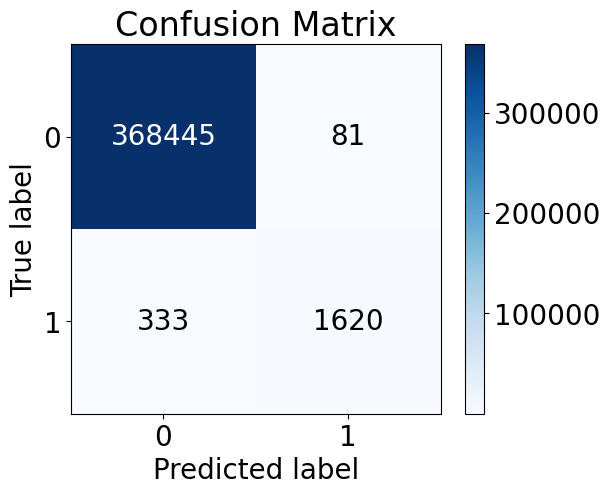

In [ ]:
import scikitplot as skplt
skplt.metrics.plot_confusion_matrix(y_test,test_preds)

<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

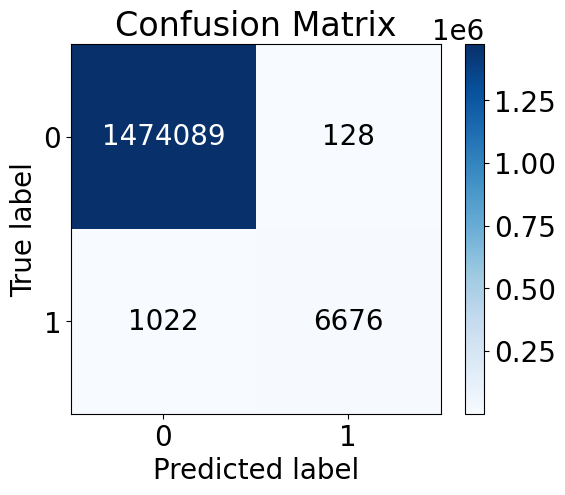

In [ ]:
skplt.metrics.plot_confusion_matrix(y_train, train_preds)

In [ ]:
print (classification_report(y_test,test_preds))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    368526
           1       0.95      0.83      0.89      1953

    accuracy                           1.00    370479
   macro avg       0.98      0.91      0.94    370479
weighted avg       1.00      1.00      1.00    370479



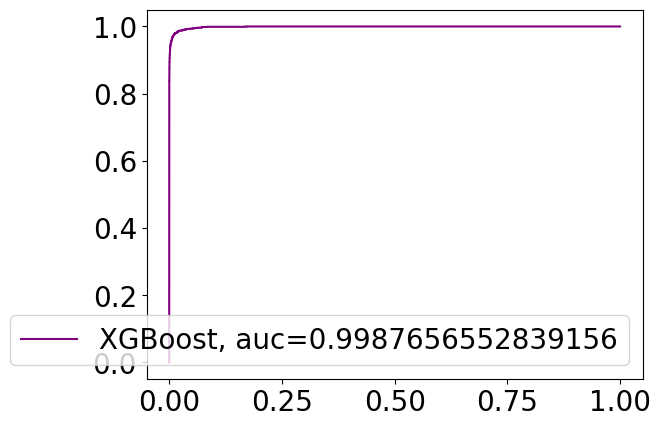

In [ ]:
y_pred_probability_xgb = xgb_model.predict_proba(X_test)[::,1]
fpr_xgb, tpr_xgb, _ = metrics.roc_curve(y_test, y_pred_probability_xgb)
xgb_auc = metrics.roc_auc_score(y_test, y_pred_probability_xgb)
plt.plot(fpr_xgb, tpr_xgb,color='purple',label="XGBoost, auc="+str(xgb_auc))
plt.legend(loc=4)
plt.show()

In [ ]:
XGB_accuracy = accuracy_score( y_test,test_preds)
print('XGBoost model accuracy is: {:.2f}%'.format(XGB_accuracy * 100))
XGB_precison = precision_score(y_test, test_preds)
print('XGBoost model precision is: {:.2f}%'.format(XGB_precison * 100))
XGB_recall = recall_score( y_test, test_preds)
print('XGBoost model recall is: {:.2f}%'.format(XGB_recall * 100))
XGB_f1 = f1_score( y_test, test_preds)
print('XGBoost model f1_score is: {:.2f}%'.format(XGB_f1 * 100))

XGB_auc =roc_auc_score( y_test, y_pred_probability_xgb)
print('XGBoost model auc is: {:.2f}%'.format(XGB_auc * 100))



XGBoost model accuracy is: 99.89%
XGBoost model precision is: 95.24%
XGBoost model recall is: 82.95%
XGBoost model f1_score is: 88.67%
XGBoost model auc is: 99.88%


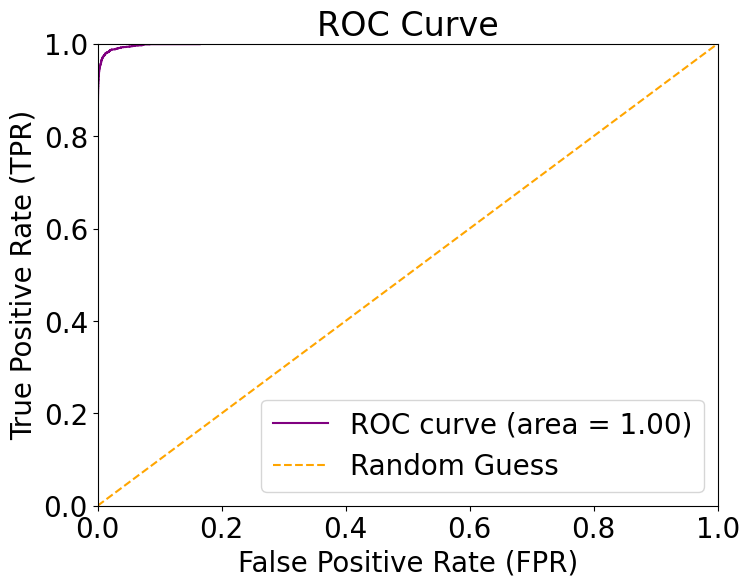

In [ ]:
xgb_fpr,xgb_tpr, _ = metrics.roc_curve(y_test, y_pred_probability_xgb)
auc_xgb = metrics.roc_auc_score(y_test, y_pred_probability_xgb)
# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(xgb_fpr,xgb_tpr, color='purple',label='ROC curve (area = %0.2f)' % auc_xgb)
plt.plot([0, 1], [0, 1], linestyle='--', color='orange', label='Random Guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

#  ADAPTIVE GRADIANT BOOSTING :)

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

In [ ]:
adap_model= AdaBoostClassifier().fit(X_train,y_train)
train_preds = adap_model.predict(X_train)
#accuracy on train
print("Model accuracy on train is: ", accuracy_score(y_train, train_preds))
#predict on test
test_preds = adap_model.predict(X_test)
#accuracy on test
print("Model accuracy on test is: ", accuracy_score(y_test, test_preds))
print('-'*50)




Model accuracy on train is:  0.9959208186704366
Model accuracy on test is:  0.9959835780165678
--------------------------------------------------


In [ ]:
train_preds =adap_model.predict(X_train)
print("Model precision on train is: ", precision_score(y_train, train_preds))
#predict on test
test_preds =adap_model.predict(X_test)
#precisionon test
print("Model precision on test is: ", precision_score(y_test, test_preds))
print('-'*50)

Model precision on train is:  0.6860229574611749
Model precision on test is:  0.707774798927614
--------------------------------------------------


In [ ]:
train_preds =adap_model.predict(X_train)
print("Model recall on train is: ", recall_score(y_train, train_preds))
#predict on test
test_preds =adap_model.predict(X_test)
#recall_score on test
print("Model recall on test is: ", recall_score(y_test, test_preds))
print('-'*50)

Model recall on train is:  0.3959469992205768
Model recall on test is:  0.4055299539170507
--------------------------------------------------


In [ ]:
train_preds =adap_model.predict(X_train)
print("Model f1_score on train is: ",f1_score(y_train, train_preds))
#predict on test
test_preds =adap_model.predict(X_test)
#f1_score on test
print("Model f1_score on test is: ", f1_score(y_test, test_preds))
print('-'*50)

Model f1_score on train is:  0.5021003212255992
Model f1_score on test is:  0.5156250000000001
--------------------------------------------------


In [ ]:
#We got good accuracy which means our model is performing quite well
#ROC
print("ROC score on train is: ", roc_auc_score(y_train, train_preds))
print("ROC score on test is: ", roc_auc_score(y_test, test_preds))
print('-'*50)

#Confusion matrix
print("confusion_matrix train is: ", confusion_matrix(y_train, train_preds))
print("confusion_matrix test is: ", confusion_matrix(y_test, test_preds))

print('-'*50)

ROC score on train is:  0.6975003670931623
ROC score on test is:  0.7023213176237701
--------------------------------------------------
confusion_matrix train is:  [[1472822    1395]
 [   4650    3048]]
confusion_matrix test is:  [[368199    327]
 [  1161    792]]
--------------------------------------------------


<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

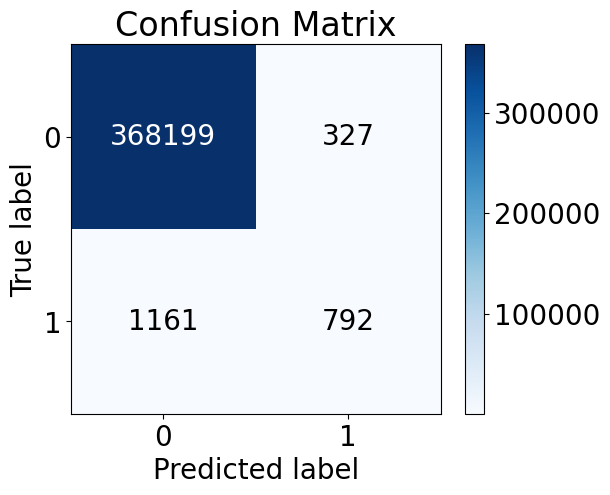

In [ ]:
skplt.metrics.plot_confusion_matrix(y_test,test_preds)

<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

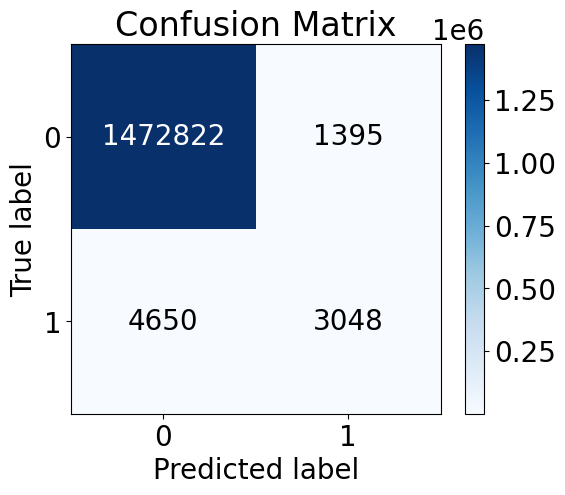

In [ ]:
skplt.metrics.plot_confusion_matrix(y_train, train_preds)

In [ ]:
print (classification_report(y_test,test_preds))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    368526
           1       0.71      0.41      0.52      1953

    accuracy                           1.00    370479
   macro avg       0.85      0.70      0.76    370479
weighted avg       1.00      1.00      1.00    370479



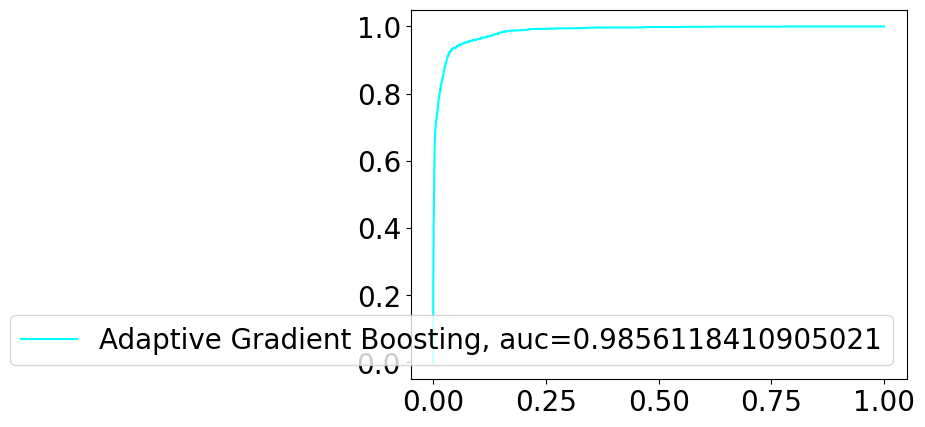

In [ ]:
y_pred_probability_ada = adap_model.predict_proba(X_test)[::,1]
fpr_ada, tpr_ada, _ = metrics.roc_curve(y_test, y_pred_probability_ada)
adaboost_auc = metrics.roc_auc_score(y_test, y_pred_probability_ada)
plt.plot(fpr_ada, tpr_ada,color='cyan',label="Adaptive Gradient Boosting, auc="+str(adaboost_auc))
plt.legend(loc=4)
plt.show()

In [ ]:
adap_accuracy = accuracy_score( y_test, test_preds)
print('AdapBoost model accuracy is: {:.2f}%'.format(adap_accuracy * 100))
adap_precison = precision_score(y_test, test_preds)
print('AdapBoost model precision is: {:.2f}%'.format(adap_precison* 100))
adap_recall = recall_score( y_test, test_preds)
print('AdaBoost model recall is: {:.2f}%'.format(adap_recall * 100))
adap_f1 = f1_score(y_test, test_preds)
print('AdaBoost model f1_score is: {:.2f}%'.format(adap_f1 * 100))
adap_auc =roc_auc_score( y_test, y_pred_probability_ada)
print('XGBoost model auc is: {:.2f}%'.format(adap_auc * 100))


AdapBoost model accuracy is: 99.60%
AdapBoost model precision is: 70.78%
AdaBoost model recall is: 40.55%
AdaBoost model f1_score is: 51.56%
XGBoost model auc is: 98.56%


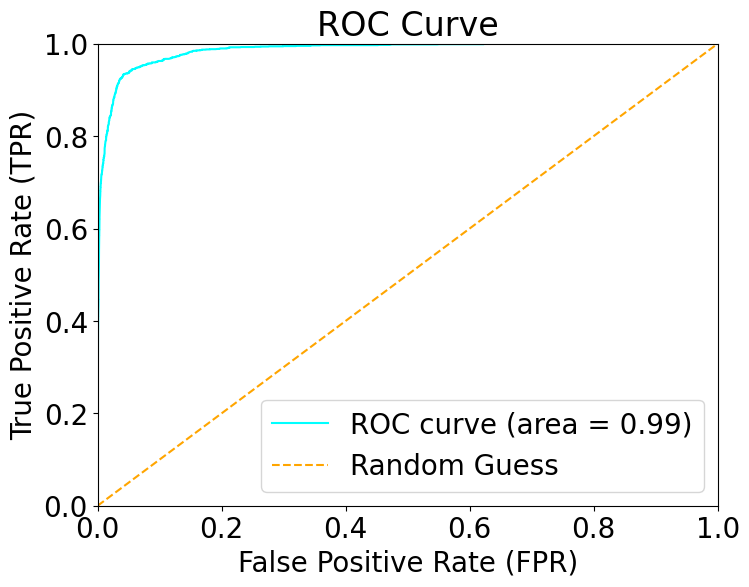

In [ ]:
adap_fpr,adap_tpr, _ = metrics.roc_curve(y_test, y_pred_probability_ada)
auc_adap = metrics.roc_auc_score(y_test, y_pred_probability_ada)
# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(adap_fpr,adap_tpr, color='cyan',label='ROC curve (area = %0.2f)' % auc_adap)
plt.plot([0, 1], [0, 1], linestyle='--', color='orange', label='Random Guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

# **RANDOM FOREST :)**

In [ ]:
rf_model = RandomForestClassifier().fit(X_train,y_train)
train_preds = rf_model.predict(X_train)
#accuracy on train
print("Model accuracy on train is: ", accuracy_score(y_train, train_preds))
#predict on test
test_preds = rf_model.predict(X_test)
#accuracy on test
print("Model accuracy on test is: ", accuracy_score(y_test, test_preds))
print('-'*50)


Model accuracy on train is:  0.999999325197464
Model accuracy on test is:  0.9985343298810458
--------------------------------------------------


In [ ]:
train_preds =rf_model.predict(X_train)
print("Model precision on train is: ", precision_score(y_train, train_preds))
#predict on test
test_preds =rf_model.predict(X_test)
#precision on test
print("Model precision on test is: ", precision_score(y_test, test_preds))
print('-'*50)

Model precision on train is:  1.0
Model precision on test is:  0.9718875502008032
--------------------------------------------------


In [ ]:
train_preds =rf_model.predict(X_train)
print("Model recall on train is: ", recall_score(y_train, train_preds))
#predict on test
test_preds =rf_model.predict(X_test)
#recall_score on test
print("Model recall on test is: ", recall_score(y_test, test_preds))
print('-'*50)

Model recall on train is:  0.9998700961288647
Model recall on test is:  0.7434715821812596
--------------------------------------------------


In [ ]:
train_preds =rf_model.predict(X_train)
print("Model f1_score on train is: ",f1_score(y_train, train_preds))
#predict on test
test_preds =rf_model.predict(X_test)
#f1_score on test
print("Model f1_score on test is: ", f1_score(y_test, test_preds))
print('-'*50)

Model f1_score on train is:  0.9999350438454043
Model f1_score on test is:  0.8424717145343777
--------------------------------------------------


In [ ]:
#We got good accuracy which means our model is performing quite well
#ROC
print("ROC score on train is: ", roc_auc_score(y_train, train_preds))
print("ROC score on test is: ", roc_auc_score(y_test, test_preds))
print('-'*50)

#Confusion matrix
print("confusion_matrix train is: ", confusion_matrix(y_train, train_preds))
print("confusion_matrix test is: ", confusion_matrix(y_test, test_preds))

print('-'*50)

ROC score on train is:  0.9999350480644323
ROC score on test is:  0.871678807322863
--------------------------------------------------
confusion_matrix train is:  [[1474217       0]
 [      1    7697]]
confusion_matrix test is:  [[368484     42]
 [   501   1452]]
--------------------------------------------------


In [ ]:
!pip install scikit-plot
import scikitplot as skplt

<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

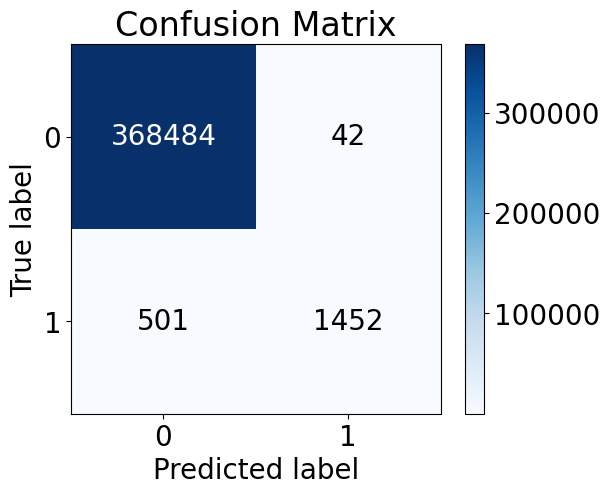

In [ ]:
skplt.metrics.plot_confusion_matrix(y_test,test_preds)

<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

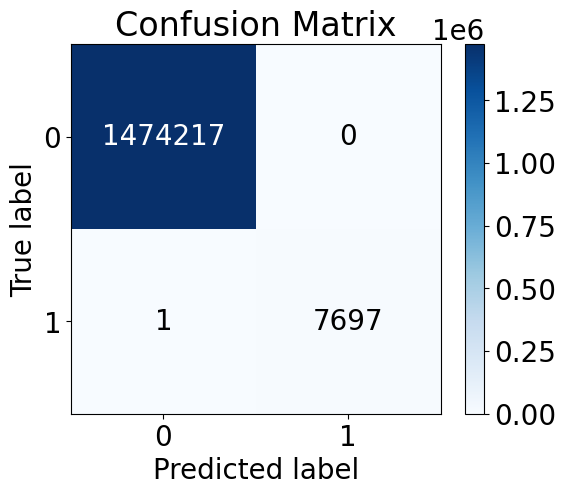

In [ ]:
skplt.metrics.plot_confusion_matrix(y_train, train_preds)

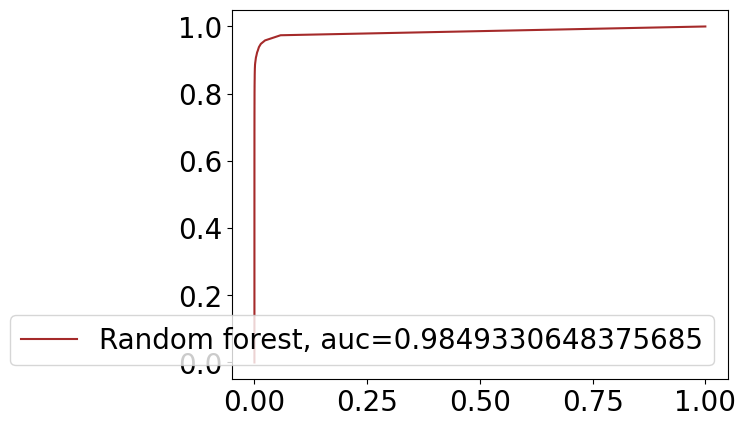

In [ ]:
y_pred_probability_rf = rf_model.predict_proba(X_test)[::,1]
fpr_rf, tpr_rf, _ = metrics.roc_curve(y_test, y_pred_probability_rf)
rf_auc = metrics.roc_auc_score(y_test, y_pred_probability_rf)
plt.plot(fpr_rf,tpr_rf,color='brown',label="Random forest, auc="+str(rf_auc))
plt.legend(loc=4)
plt.show()


In [ ]:
rf_accuracy = accuracy_score(y_test, test_preds)
print('RF model accuracy is: {:.2f}%'.format(rf_accuracy * 100))
rf_precison = precision_score( y_test, test_preds)
print('RF model precision is: {:.2f}%'.format(rf_precison * 100))
rf_recall = recall_score( y_test, test_preds)
print('RF model recall is: {:.2f}%'.format(rf_recall * 100))
rf_f1 = f1_score( y_test, test_preds)
print('RF model f1_score is: {:.2f}%'.format(rf_f1 * 100))
rf_auc =roc_auc_score( y_test, y_pred_probability_rf)
print('RF model auc is: {:.2f}%'.format(rf_auc * 100))


RF model accuracy is: 99.85%
RF model precision is: 97.19%
RF model recall is: 74.35%
RF model f1_score is: 84.25%
RF model auc is: 98.49%


In [ ]:
print (classification_report(y_test,test_preds))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    368526
           1       0.97      0.74      0.84      1953

    accuracy                           1.00    370479
   macro avg       0.99      0.87      0.92    370479
weighted avg       1.00      1.00      1.00    370479



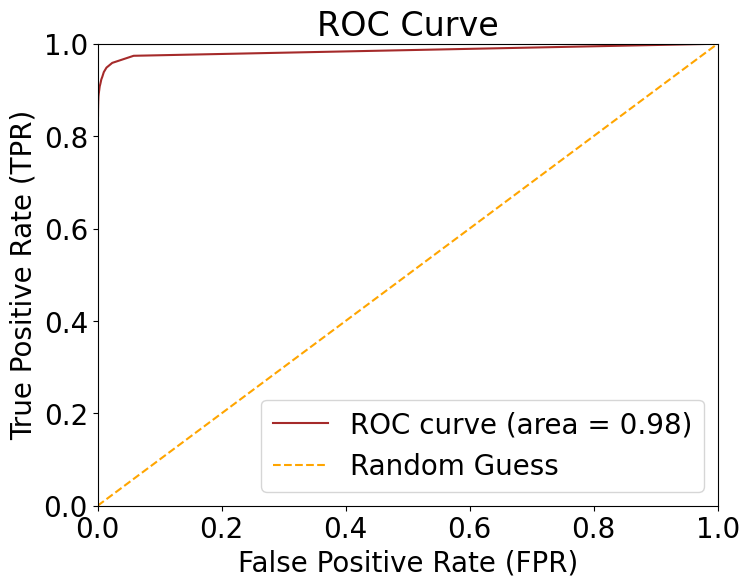

In [ ]:
rf_fpr,rf_tpr, _ = metrics.roc_curve(y_test, y_pred_probability_rf)
auc_rf = metrics.roc_auc_score(y_test, y_pred_probability_rf)
# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(rf_fpr,rf_tpr, color='brown',label='ROC curve (area = %0.2f)' % auc_rf)
plt.plot([0, 1], [0, 1], linestyle='--', color='orange', label='Random Guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

# **LGM BOOST :)**

In [ ]:
!pip install lightgbm

In [ ]:
import lightgbm as lgb

In [ ]:
lgb_model = lgb.LGBMClassifier(objective='binary', learning_rate=0.1, n_estimators=100).fit(X_train,y_train)
train_preds = lgb_model.predict(X_train)
#accuracy on train
print("Model accuracy on train is: ", accuracy_score(y_train, train_preds))
#predict on test
test_preds = lgb_model.predict(X_test)
#accuracy on test
print("Model accuracy on test is: ", accuracy_score(y_test, test_preds))
print('-'*50)


[LightGBM] [Info] Number of positive: 7698, number of negative: 1474217
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.397361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 1481915, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.005195 -> initscore=-5.254922
[LightGBM] [Info] Start training from score -5.254922
Model accuracy on train is:  0.9974573440446989
Model accuracy on test is:  0.9971739288866576
--------------------------------------------------


In [ ]:
train_preds =lgb_model.predict(X_train)
print("Model precision on train is: ", precision_score(y_train, train_preds))
#predict on test
test_preds =lgb_model.predict(X_test)
# precision_score on test
print("Model precision on test is: ", precision_score(y_test, test_preds))
print('-'*50)

Model precision on train is:  0.7661159263271939
Model precision on test is:  0.7381703470031545
--------------------------------------------------


In [ ]:
train_preds =lgb_model.predict(X_train)
print("Model recall on train is: ", recall_score(y_train, train_preds))
#predict on test
test_preds =lgb_model.predict(X_test)
#recall_score on test
print("Model recall on test is: ", recall_score(y_test, test_preds))
print('-'*50)

Model recall on train is:  0.7348661990127305
Model recall on test is:  0.7188940092165899
--------------------------------------------------


In [ ]:
train_preds =lgb_model.predict(X_train)
print("Model f1_score on train is: ",f1_score(y_train, train_preds))
#predict on test
test_preds =lgb_model.predict(X_test)
#f1_score on test
print("Model f1_score on test is: ", f1_score(y_test, test_preds))
print('-'*50)

Model f1_score on train is:  0.7501657605092164
Model f1_score on test is:  0.7284046692607005
--------------------------------------------------


In [ ]:
#We got good accuracy which means our model is performing quite well
#ROC
print("ROC score on train is: ", roc_auc_score(y_train, train_preds))
print("ROC score on test is: ", roc_auc_score(y_test, test_preds))
print('-'*50)

#Confusion matrix
print("confusion_matrix train is: ", confusion_matrix(y_train, train_preds))
print("confusion_matrix test is: ", confusion_matrix(y_test, test_preds))

print('-'*50)

ROC score on train is:  0.8668473648417943
ROC score on test is:  0.8587713399333466
--------------------------------------------------
confusion_matrix train is:  [[1472490    1727]
 [   2041    5657]]
confusion_matrix test is:  [[368028    498]
 [   549   1404]]
--------------------------------------------------


<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

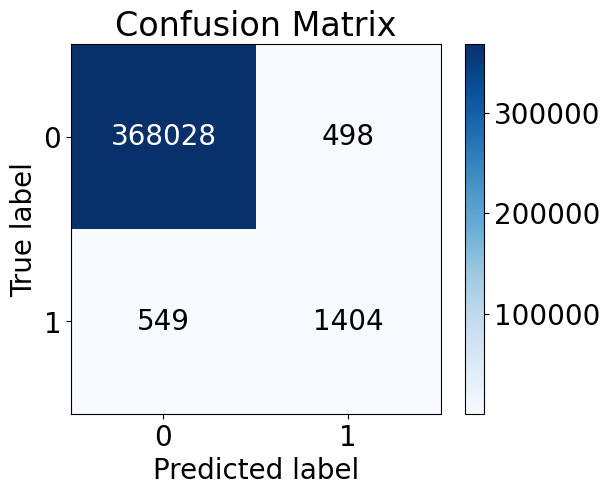

In [ ]:
skplt.metrics.plot_confusion_matrix(y_test,test_preds)

<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

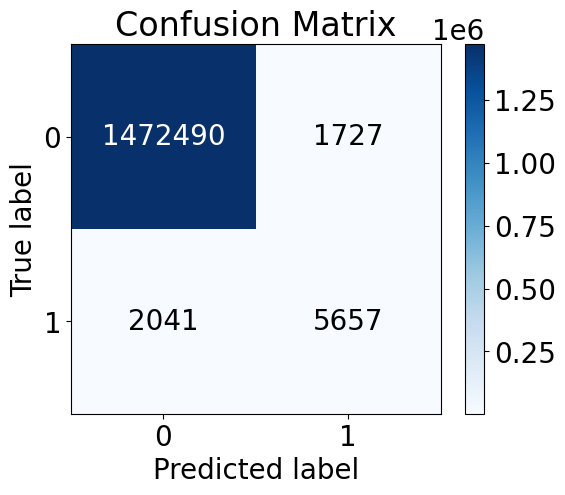

In [ ]:
skplt.metrics.plot_confusion_matrix(y_train, train_preds)

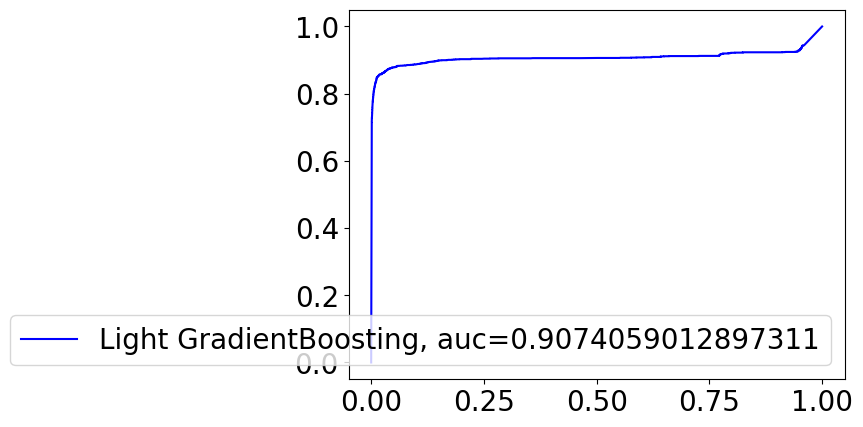

In [ ]:
y_pred_probability_lgb = lgb_model.predict_proba(X_test)[::,1]
fpr_lgb, tpr_lgb, _ = metrics.roc_curve(y_test, y_pred_probability_lgb)
auc_lgb = metrics.roc_auc_score(y_test, y_pred_probability_lgb)
plt.plot(fpr_lgb, tpr_lgb,color='blue',label="Light GradientBoosting, auc="+str(auc_lgb))
plt.legend(loc=4)
plt.show()

In [ ]:
lgb_accuracy = accuracy_score(y_test,test_preds)
print('LGB model accuracy is: {:.2f}%'.format(lgb_accuracy * 100))
lgb_precison = precision_score(y_test,test_preds)
print('LGB model precision is: {:.2f}%'.format(lgb_precison * 100))
lgb_recall = recall_score(y_test,test_preds)
print('LGB model recall is: {:.2f}%'.format(lgb_recall * 100))
lgb_f1 = f1_score( y_test,test_preds)
print('LGB model f1_score is: {:.2f}%'.format(lgb_f1 * 100))
lgb_auc =roc_auc_score( y_test, y_pred_probability_lgb)
print('LGB model auc is: {:.2f}%'.format(lgb_auc * 100))

LGB model accuracy is: 99.72%
LGB model precision is: 73.82%
LGB model recall is: 71.89%
LGB model f1_score is: 72.84%
LGB model auc is: 90.74%


In [ ]:
print (classification_report(y_test,test_preds))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    368526
           1       0.74      0.72      0.73      1953

    accuracy                           1.00    370479
   macro avg       0.87      0.86      0.86    370479
weighted avg       1.00      1.00      1.00    370479



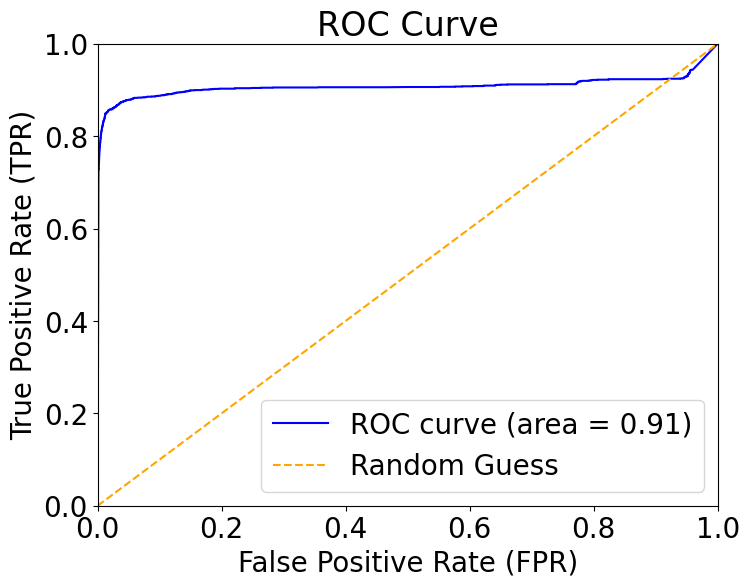

In [ ]:
lgb_fpr,lgb_tpr, _ = metrics.roc_curve(y_test, y_pred_probability_lgb)
auc_lgb = metrics.roc_auc_score(y_test, y_pred_probability_lgb)
# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(lgb_fpr,lgb_tpr, color='blue',label='ROC curve (area = %0.2f)' % auc_lgb)
plt.plot([0, 1], [0, 1], linestyle='--', color='orange', label='Random Guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

# **CATBOOST :)**

In [ ]:
!pip install catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.2/98.2 MB 2.1 MB/s eta 0:00:00


In [ ]:
from catboost import CatBoostClassifier

cat_model =CatBoostClassifier(objective='CrossEntropy', learning_rate=0.1, n_estimators=100).fit(X_train,y_train)
train_preds = cat_model.predict(X_train)
#accuracy on train
print("Model accuracy on train is: ", accuracy_score(y_train, train_preds))
#predict on test
test_preds = cat_model.predict(X_test)
#accuracy on test
print("Model accuracy on test is: ", accuracy_score(y_test, test_preds))
print('-'*50)

0:	learn: 0.6006911	total: 484ms	remaining: 47.9s
1:	learn: 0.5235614	total: 873ms	remaining: 42.8s
2:	learn: 0.4590068	total: 1.23s	remaining: 39.7s
3:	learn: 0.4052413	total: 1.74s	remaining: 41.8s
4:	learn: 0.3592290	total: 2.25s	remaining: 42.7s
5:	learn: 0.3190739	total: 2.8s	remaining: 43.8s
6:	learn: 0.2852496	total: 3.43s	remaining: 45.6s
7:	learn: 0.2550794	total: 4.06s	remaining: 46.7s
8:	learn: 0.2285473	total: 4.63s	remaining: 46.8s
9:	learn: 0.2054304	total: 5.24s	remaining: 47.1s
10:	learn: 0.1847977	total: 5.64s	remaining: 45.6s
11:	learn: 0.1666216	total: 6.04s	remaining: 44.3s
12:	learn: 0.1502641	total: 6.45s	remaining: 43.2s
13:	learn: 0.1357564	total: 6.84s	remaining: 42s
14:	learn: 0.1228080	total: 7.29s	remaining: 41.3s
15:	learn: 0.1112425	total: 7.62s	remaining: 40s
16:	learn: 0.1011147	total: 8s	remaining: 39.1s
17:	learn: 0.0918606	total: 8.32s	remaining: 37.9s
18:	learn: 0.0837574	total: 8.73s	remaining: 37.2s
19:	learn: 0.0764165	total: 9.11s	remaining: 36.4

In [ ]:
train_preds =cat_model.predict(X_train)
print("Model precision on train is: ", precision_score(y_train, train_preds))
#predict on test
test_preds =cat_model.predict(X_test)
#precision_score on test
print("Model precision on test is: ", precision_score(y_test, test_preds))
print('-'*50)

Model precision on train is:  0.9462738301559792
Model precision on test is:  0.949898442789438
--------------------------------------------------


In [ ]:
train_preds =cat_model.predict(X_train)
print("Model recall on train is: ", recall_score(y_train, train_preds))
#predict on test
test_preds =cat_model.predict(X_test)
#recall_score on test
print("Model recall on test is: ", recall_score(y_test, test_preds))
print('-'*50)

Model recall on train is:  0.7092751363990647
Model recall on test is:  0.7183819764464926
--------------------------------------------------


In [ ]:
train_preds =cat_model.predict(X_train)
print("Model f1_score on train is: ",f1_score(y_train, train_preds))
#predict on test
test_preds =cat_model.predict(X_test)
#f1_score on test
print("Model f1_score on test is: ", f1_score(y_test, test_preds))
print('-'*50)

Model f1_score on train is:  0.8108108108108109
Model f1_score on test is:  0.8180758017492712
--------------------------------------------------


In [ ]:

#ROC
print("ROC score on train is: ", roc_auc_score(y_train, train_preds))
print("ROC score on test is: ", roc_auc_score(y_test, test_preds))
print('-'*50)

#Confusion matrix
print("confusion_matrix train is: ", confusion_matrix(y_train, train_preds))
print("confusion_matrix test is: ", confusion_matrix(y_test, test_preds))

print('-'*50)

ROC score on train is:  0.854532427640171
ROC score on test is:  0.8590905882514668
--------------------------------------------------
confusion_matrix train is:  [[1473907     310]
 [   2238    5460]]
confusion_matrix test is:  [[368452     74]
 [   550   1403]]
--------------------------------------------------


<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

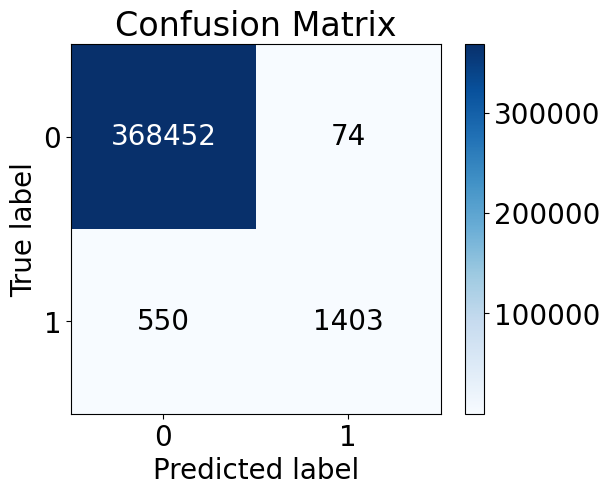

In [ ]:
skplt.metrics.plot_confusion_matrix(y_test,test_preds)

<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

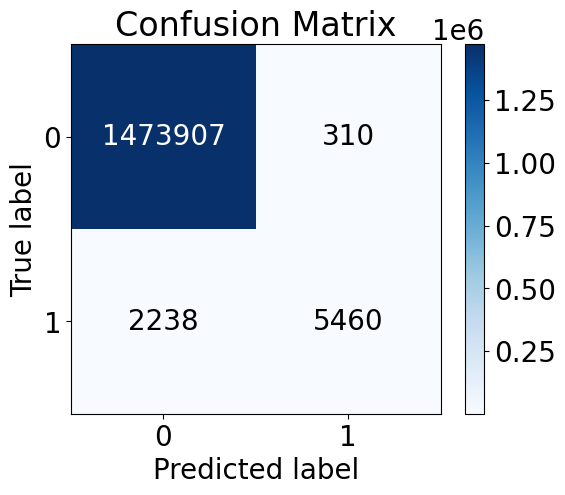

In [ ]:
skplt.metrics.plot_confusion_matrix(y_train, train_preds)

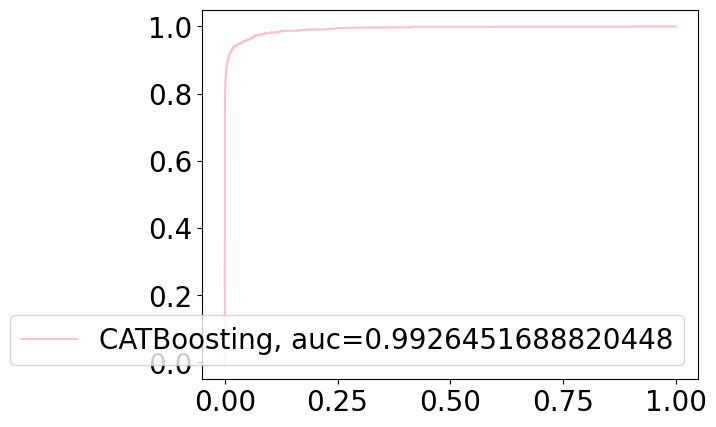

In [ ]:
y_pred_probability_cb= cat_model.predict_proba(X_test)[::,1]
fpr_cb, tpr_cb, _ = metrics.roc_curve(y_test, y_pred_probability_cb)
auc_cb = metrics.roc_auc_score(y_test, y_pred_probability_cb)
plt.plot(fpr_cb, tpr_cb,color='pink',label="CATBoosting, auc="+str(auc_cb))
plt.legend(loc=4)
plt.show()

In [ ]:
cat_accuracy = accuracy_score( y_test,test_preds)
print('LGB model accuracy is: {:.2f}%'.format(cat_accuracy * 100))
cat_precison = precision_score( y_test,test_preds)
print('LGB model precision is: {:.2f}%'.format(cat_precison * 100))
cat_recall = recall_score(y_test,test_preds)
print('LGB model recall is: {:.2f}%'.format(cat_recall * 100))
cat_f1 = f1_score( y_test,test_preds)
print('LGB model f1_score is: {:.2f}%'.format(cat_f1 * 100))
cat_auc =roc_auc_score( y_test, y_pred_probability_cb)
print('LGB model auc is: {:.2f}%'.format(cat_auc * 100))

LGB model accuracy is: 99.83%
LGB model precision is: 94.99%
LGB model recall is: 71.84%
LGB model f1_score is: 81.81%
LGB model auc is: 99.26%


In [ ]:
print (classification_report(y_test,test_preds))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    368526
           1       0.95      0.72      0.82      1953

    accuracy                           1.00    370479
   macro avg       0.97      0.86      0.91    370479
weighted avg       1.00      1.00      1.00    370479



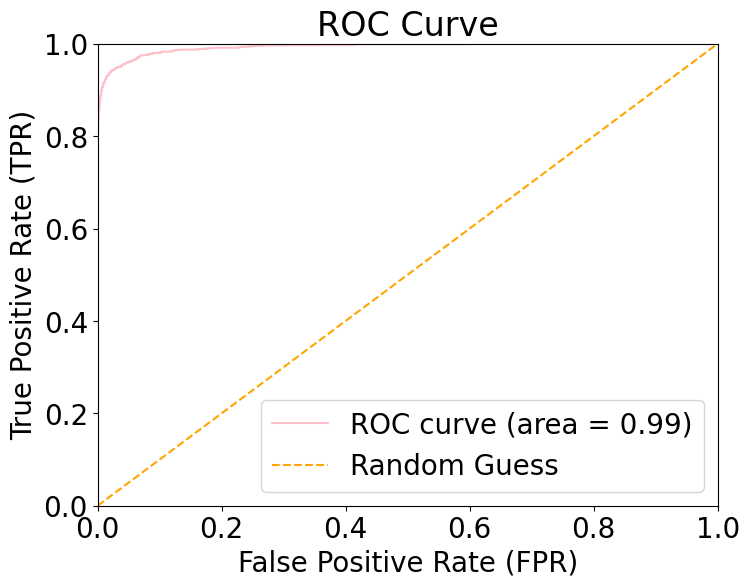

In [ ]:
cb_fpr,cb_tpr, _ = metrics.roc_curve(y_test, y_pred_probability_cb)
auc_cb = metrics.roc_auc_score(y_test, y_pred_probability_cb)
# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(cb_fpr,cb_tpr, color='pink',label='ROC curve (area = %0.2f)' % auc_cb)
plt.plot([0, 1], [0, 1], linestyle='--', color='orange', label='Random Guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

# **HistGradientBoosting  :)**

In [ ]:
from sklearn.ensemble import HistGradientBoostingClassifier

In [ ]:
hgb_model =HistGradientBoostingClassifier(max_iter=100, learning_rate=0.1).fit(X_train,y_train)
train_preds = hgb_model .predict(X_train)
#accuracy on train
print("Model accuracy on train is: ", accuracy_score(y_train, train_preds))
#predict on test
test_preds = hgb_model.predict(X_test)
#accuracy on test
print("Model accuracy on test is: ", accuracy_score(y_test, test_preds))
print('-'*50)

Model accuracy on train is:  0.9970146735811433
Model accuracy on test is:  0.9968770159712157
--------------------------------------------------


In [ ]:
train_preds =hgb_model.predict(X_train)
print("Model precision on train is: ", precision_score(y_train, train_preds))
#predict on test
test_preds =hgb_model.predict(X_test)
#precision_score on test
print("Model precision on test is: ", precision_score(y_test, test_preds))
print('-'*50)

Model precision on train is:  0.9351408825093036
Model precision on test is:  0.9373626373626374
--------------------------------------------------


In [ ]:
train_preds =hgb_model.predict(X_train)
print("Model recall on train is: ", recall_score(y_train, train_preds))
#predict on test
test_preds =hgb_model.predict(X_test)
#recall_score on test
print("Model recall on test is: ", recall_score(y_test, test_preds))
print('-'*50)

Model recall on train is:  0.45700181865419587
Model recall on test is:  0.43676395289298514
--------------------------------------------------


In [ ]:
train_preds =hgb_model.predict(X_train)
print("Model f1_score on train is: ",f1_score(y_train, train_preds))
#predict on test
test_preds =hgb_model.predict(X_test)
#f1_score on test
print("Model f1_score on test is: ", f1_score(y_test, test_preds))
print('-'*50)

Model f1_score on train is:  0.6139616055846422
Model f1_score on test is:  0.5958784491791826
--------------------------------------------------


In [ ]:
#ROC
print("ROC score on train is: ", roc_auc_score(y_train, train_preds))
print("ROC score on test is: ", roc_auc_score(y_test, test_preds))
print('-'*50)

#Confusion matrix
print("confusion_matrix train is: ", confusion_matrix(y_train, train_preds))
print("confusion_matrix test is: ", confusion_matrix(y_test, test_preds))

print('-'*50)

ROC score on train is:  0.7284181535319877
ROC score on test is:  0.7183046413330949
--------------------------------------------------
confusion_matrix train is:  [[1473973     244]
 [   4180    3518]]
confusion_matrix test is:  [[368469     57]
 [  1100    853]]
--------------------------------------------------


<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

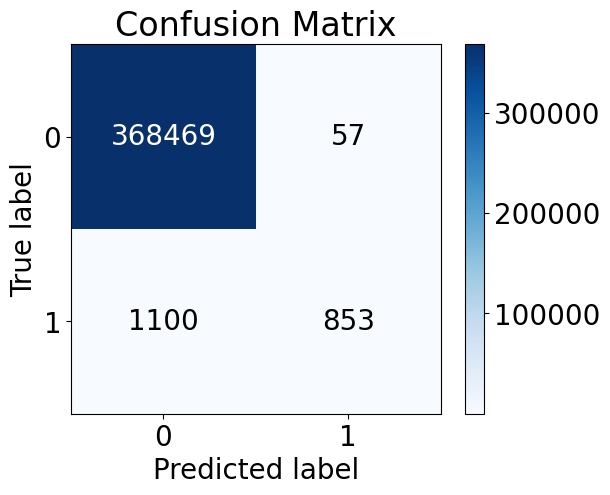

In [ ]:
skplt.metrics.plot_confusion_matrix(y_test,test_preds)

<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

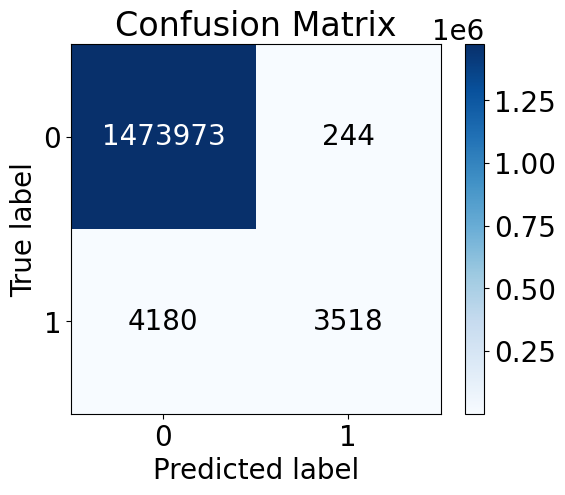

In [ ]:
skplt.metrics.plot_confusion_matrix(y_train, train_preds)

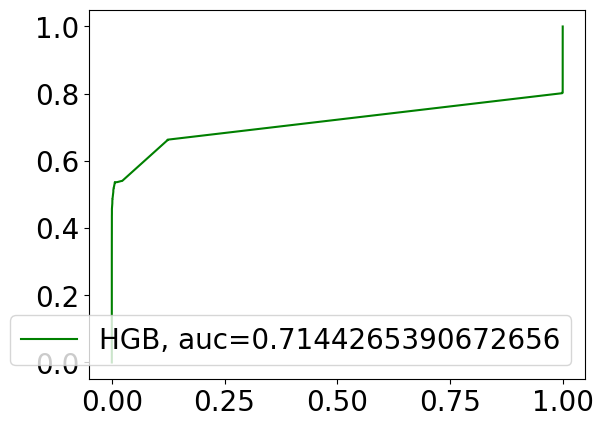

In [ ]:
y_pred_probability_hgb = hgb_model.predict_proba(X_test)[::,1]
fpr_hgb, tpr_hgb, _ = metrics.roc_curve(y_test, y_pred_probability_hgb)
auc_hgb = metrics.roc_auc_score(y_test, y_pred_probability_hgb)
plt.plot(fpr_hgb, tpr_hgb,color='green',label="HGB, auc="+str(auc_hgb))
plt.legend(loc=4)
plt.show()

In [ ]:
hgb_accuracy = accuracy_score( y_test,test_preds)
print('HGB model accuracy is: {:.2f}%'.format(hgb_accuracy * 100))
hgb_precison = precision_score(y_test,test_preds)
print('HGB model precision is: {:.2f}%'.format(hgb_precison * 100))
hgb_recall = recall_score(y_test,test_preds)
print('HGB model recall is: {:.2f}%'.format(hgb_recall * 100))
hgb_f1 = f1_score(y_test,test_preds)
print('HGB model f1_score is: {:.2f}%'.format(hgb_f1 * 100))
hgb_auc =roc_auc_score( y_test, y_pred_probability_hgb)
print('HGB model auc is: {:.2f}%'.format(hgb_auc * 100))

HGB model accuracy is: 99.69%
HGB model precision is: 93.74%
HGB model recall is: 43.68%
HGB model f1_score is: 59.59%
HGB model auc is: 71.44%


In [ ]:
print (classification_report(y_test,test_preds))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    368526
           1       0.94      0.44      0.60      1953

    accuracy                           1.00    370479
   macro avg       0.97      0.72      0.80    370479
weighted avg       1.00      1.00      1.00    370479



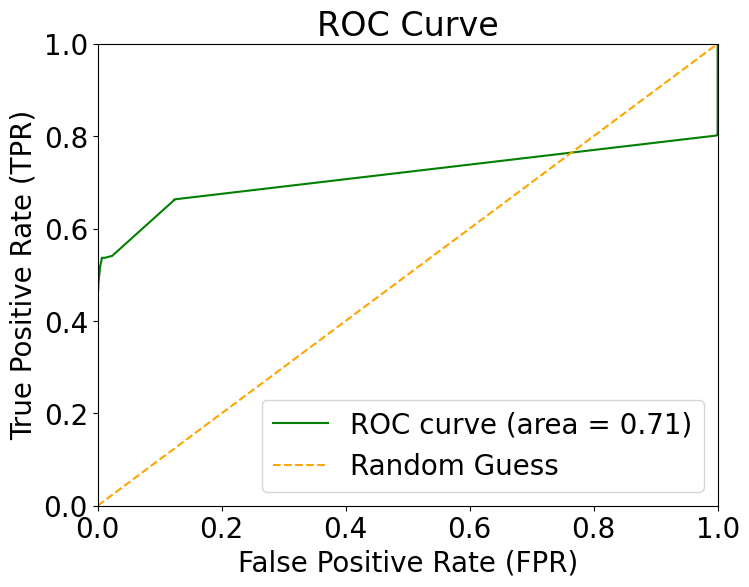

In [ ]:
hgb_fpr,hgb_tpr, _ = metrics.roc_curve(y_test, y_pred_probability_hgb)
auc_hgb = metrics.roc_auc_score(y_test, y_pred_probability_hgb)
# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(hgb_fpr,hgb_tpr, color='green',label='ROC curve (area = %0.2f)' % auc_hgb)
plt.plot([0, 1], [0, 1], linestyle='--', color='orange', label='Random Guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

# **COMPARSATION :):):)**

In [ ]:
Algorithms = ['XGBClassifier','AdaBoostClassifier', 'RandomForest', 'LGBMClassifier','CatBoostClassifier','HistGradientBoostingClassifier' ]
accuracy = [XGB_accuracy, adap_accuracy, rf_accuracy,lgb_accuracy ,cat_accuracy, hgb_accuracy]

FinalResult=pd.DataFrame({'Algorithm':Algorithms, 'Accuracy':accuracy})

FinalResult

,Algorithm,Accuracy
0,XGBClassifier,0.998883
1,AdaBoostClassifier,0.995984
2,RandomForest,0.998534
3,LGBMClassifier,0.997174
4,CatBoostClassifier,0.998316
5,HistGradientBoostingClassifier,0.996877


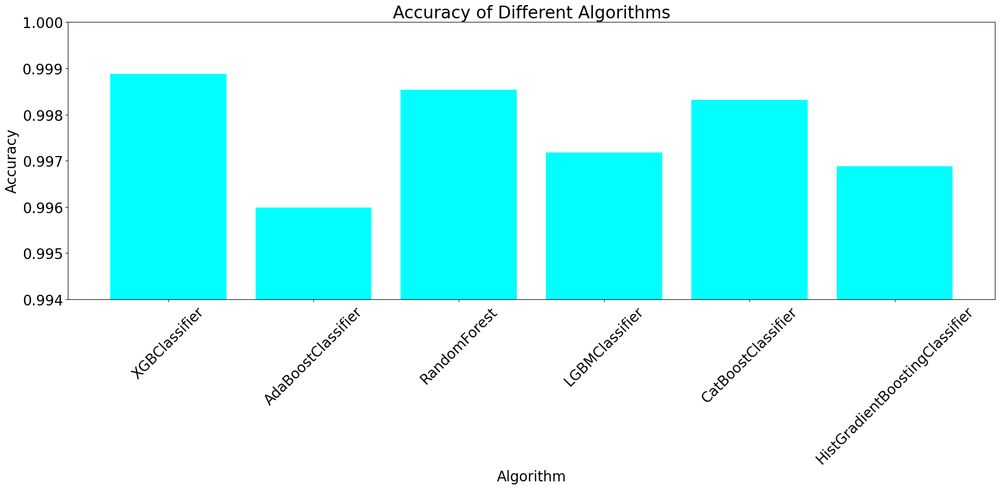

In [ ]:
plt.figure(figsize=(20, 10))
plt.bar(FinalResult['Algorithm'], FinalResult['Accuracy'], color='cyan')
plt.xlabel('Algorithm')
plt.ylabel('Accuracy')
plt.title('Accuracy of Different Algorithms')
plt.ylim(0.994, 1)  # Set the limit of y-axis from 0 to 1 (accuracy ranges from 0 to 1)
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility

plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

In [ ]:
Algorithms = ['XGBClassifier','AdaBoostClassifier', 'RandomForest', 'LGBMClassifier','CatBoostClassifier','HistGradientBoostingClassifier'  ]
precision = [XGB_precison, adap_precison, rf_precison,lgb_precison ,cat_precison,hgb_precison ]

FinalResult=pd.DataFrame({'Algorithm':Algorithms, 'Precision':precision})

FinalResult

,Algorithm,Precision
0,XGBClassifier,0.952381
1,AdaBoostClassifier,0.707775
2,RandomForest,0.971888
3,LGBMClassifier,0.738170
4,CatBoostClassifier,0.949898
5,HistGradientBoostingClassifier,0.937363


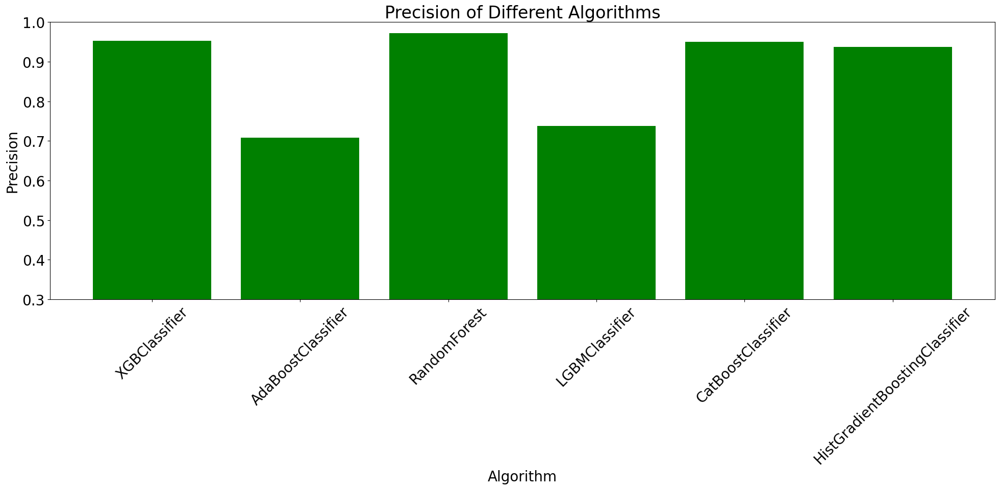

In [ ]:
plt.figure(figsize=(20, 10))
plt.bar(FinalResult['Algorithm'], FinalResult['Precision'], color='green')
plt.xlabel('Algorithm')
plt.ylabel('Precision')
plt.title('Precision of Different Algorithms')
plt.ylim(0.3, 1)  # Set the limit of y-axis from 0 to 1 (Precision ranges from 0 to 1)
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility

plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

In [ ]:
Algorithms = ['XGBClassifier','AdaBoostClassifier', 'RandomForest', 'LGBMClassifier','CatBoostClassifier','HistGradientBoostingClassifier'  ]
recall = [XGB_recall, adap_recall, rf_recall,lgb_recall ,cat_recall ,hgb_recall ]

FinalResult=pd.DataFrame({'Algorithm':Algorithms, 'Recall':recall })

FinalResult

,Algorithm,Recall
0,XGBClassifier,0.829493
1,AdaBoostClassifier,0.405530
2,RandomForest,0.743472
3,LGBMClassifier,0.718894
4,CatBoostClassifier,0.718382
5,HistGradientBoostingClassifier,0.436764


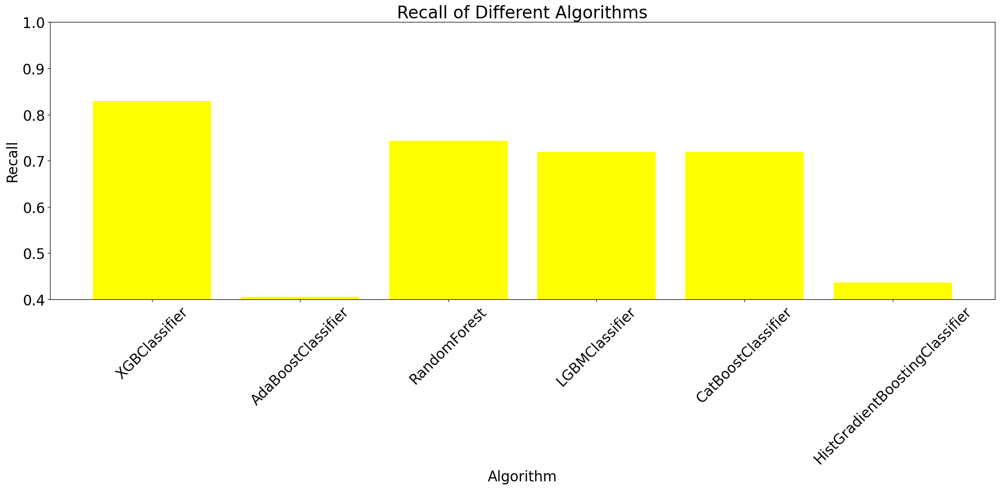

In [ ]:
plt.figure(figsize=(20, 10))
plt.bar(FinalResult['Algorithm'], FinalResult['Recall'], color='yellow')
plt.xlabel('Algorithm')
plt.ylabel('Recall')
plt.title('Recall of Different Algorithms')
plt.ylim(0.4, 1)  # Set the limit of y-axis from 0 to 1 (Recall ranges from 0 to 1)
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility

plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

In [ ]:
Algorithms = ['XGBClassifier','AdaBoostClassifier', 'RandomForest', 'LGBMClassifier','CatBoostClassifier' ,'HistGradientBoostingClassifier' ]
F1 = [XGB_f1, adap_f1, rf_f1,lgb_f1 ,cat_f1,hgb_f1 ]

FinalResult=pd.DataFrame({'Algorithm':Algorithms, 'F1':F1 })

FinalResult

,Algorithm,F1
0,XGBClassifier,0.886700
1,AdaBoostClassifier,0.515625
2,RandomForest,0.842472
3,LGBMClassifier,0.728405
4,CatBoostClassifier,0.818076
5,HistGradientBoostingClassifier,0.595878


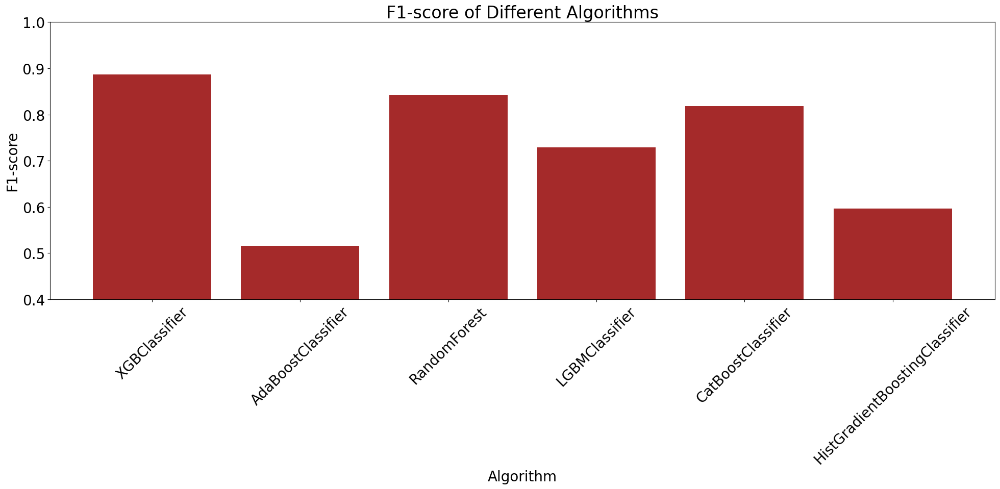

In [ ]:
plt.figure(figsize=(20, 10))
plt.bar(FinalResult['Algorithm'], FinalResult['F1'], color='brown')
plt.xlabel('Algorithm')
plt.ylabel('F1-score')
plt.title('F1-score of Different Algorithms')
plt.ylim(0.4, 1)  # Set the limit of y-axis from 0 to 1 (F1 ranges from 0 to 1)
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility

plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

In [ ]:
Algorithms = ['XGBClassifier','AdaBoostClassifier', 'RandomForest', 'LGBMClassifier','CatBoostClassifier' ,'HistGradientBoostingClassifier' ]
AUC= [XGB_auc, adap_auc, rf_auc,lgb_auc ,cat_auc,hgb_auc ]

FinalResult=pd.DataFrame({'Algorithm':Algorithms, 'AUC':AUC })

FinalResult

,Algorithm,AUC
0,XGBClassifier,0.998766
1,AdaBoostClassifier,0.985612
2,RandomForest,0.984933
3,LGBMClassifier,0.907406
4,CatBoostClassifier,0.992645
5,HistGradientBoostingClassifier,0.714427


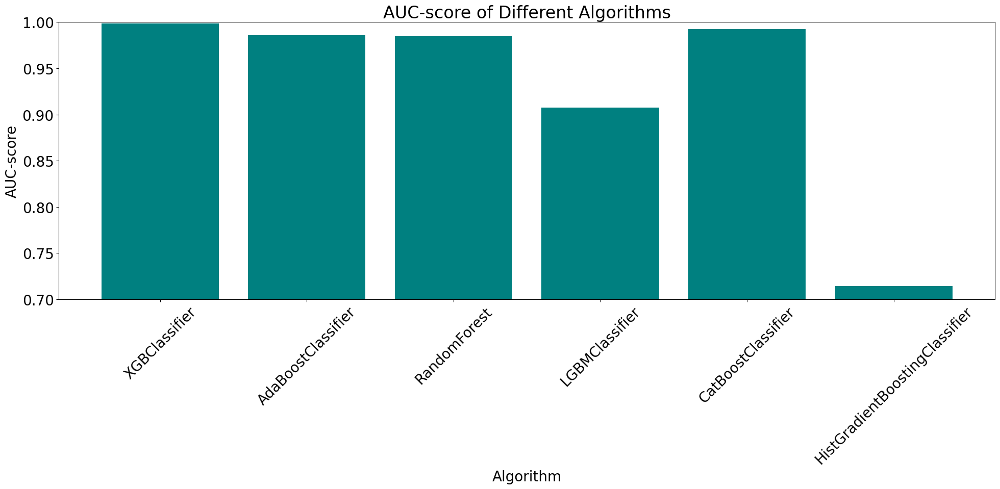

In [ ]:
plt.figure(figsize=(20, 10))
plt.bar(FinalResult['Algorithm'], FinalResult['AUC'], color='teal')
plt.xlabel('Algorithm')
plt.ylabel('AUC-score')
plt.title('AUC-score of Different Algorithms')
plt.ylim(0.7, 1)
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility

plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

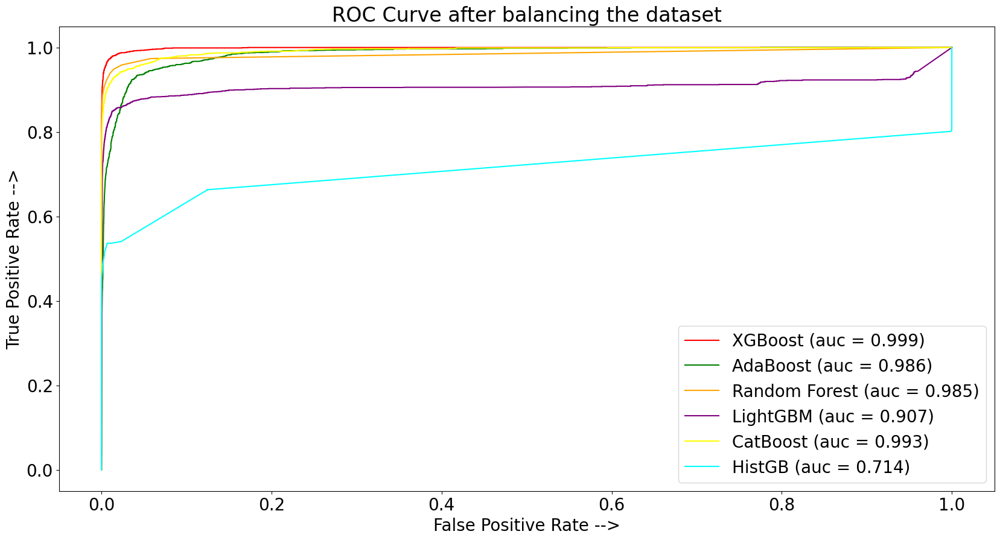

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming you have your models trained and data prepared

# List of models and their predicted probabilities
models = [("XGBoost", xgb_model), ("AdaBoost", adap_model), ("Random Forest", rf_model),
          ("LightGBM", lgb_model), ("CatBoost", cat_model), ("HistGB", hgb_model)]  # Replace with actual models

all_fpr = []
all_tpr = []
all_auc = []
colors = ['red', 'green', 'orange', 'purple', 'yellow', 'cyan']  # Adjust colors as needed

for name, model in models:
    y_pred_probability = model.predict_proba(X_test)[::, 1]
    fpr, tpr, _ = roc_curve(y_test, y_pred_probability)
    roc_auc = auc(fpr, tpr)
    all_fpr.append(fpr)
    all_tpr.append(tpr)
    all_auc.append(roc_auc)

plt.figure(figsize=(20, 10), dpi=100)
for i, (name, _) in enumerate(models):
    plt.plot(all_fpr[i], all_tpr[i], linestyle='-', color=colors[i],
             label=f'{name} (auc = {all_auc[i]:.3f})')

plt.xlabel('False Positive Rate -->')
plt.ylabel('True Positive Rate -->')
plt.title('ROC Curve after balancing the dataset')
plt.legend(loc='lower right')
plt.show()


# **voting classifier**

In [ ]:
import xgboost as xgb

In [ ]:
from sklearn.ensemble import VotingClassifier, RandomForestClassifier
import xgboost as xgb
from catboost import CatBoostClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import HistGradientBoostingClassifier
import lightgbm as lgb
# Define individual models
xgb_model = xgb.XGBClassifier(objective='binary:logistic')
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Add CatBoost model
from catboost import CatBoostClassifier
cat_model = CatBoostClassifier(iterations=100, learning_rate=0.1, depth=3)

# Add AdaBoost model
from sklearn.ensemble import AdaBoostClassifier
adap_model = AdaBoostClassifier(n_estimators=100, random_state=42)

# Add HistGradientBoost model
from sklearn.ensemble import HistGradientBoostingClassifier
hgb_model = HistGradientBoostingClassifier(max_iter=100, random_state=42)

# Add LGBMBoost model
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(objective='binary', max_depth=3, num_leaves=31, learning_rate=0.05)

# Create the voting classifier
voting = VotingClassifier(estimators=[
    ('xgb', xgb_model),
    ('rf', rf_model),
    ('cat', cat_model),
    ('ada', adap_model),
    ('hist', hgb_model),
    ('lgb', lgb_model)
], voting='soft')

# Train the voting classifier
voting.fit(X_train, y_train)
# Make predictions
y_pred = voting.predict(X_test)

# Evaluate model performance (e.g., accuracy)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
auc = roc_auc_score(y_test, y_pred)
print(f"Voting Classifier Accuracy: {accuracy}")
print(f"Voting Classifier Precision: {precision}")
print(f"Voting Classifier Recall: {recall}")
print(f"Voting Classifier F1-score: {f1}")
print(f"Voting Classifier AUC: {auc}")


0:	learn: 0.6007786	total: 162ms	remaining: 16s
1:	learn: 0.5245722	total: 320ms	remaining: 15.7s
2:	learn: 0.4598521	total: 455ms	remaining: 14.7s
3:	learn: 0.4059479	total: 583ms	remaining: 14s
4:	learn: 0.3598496	total: 716ms	remaining: 13.6s
5:	learn: 0.3202311	total: 840ms	remaining: 13.2s
6:	learn: 0.2857184	total: 966ms	remaining: 12.8s
7:	learn: 0.2556400	total: 1.1s	remaining: 12.7s
8:	learn: 0.2291101	total: 1.23s	remaining: 12.4s
9:	learn: 0.2060553	total: 1.38s	remaining: 12.4s
10:	learn: 0.1854802	total: 1.5s	remaining: 12.2s
11:	learn: 0.1675853	total: 1.63s	remaining: 11.9s
12:	learn: 0.1513137	total: 1.76s	remaining: 11.8s
13:	learn: 0.1372179	total: 1.9s	remaining: 11.7s
14:	learn: 0.1243914	total: 2.04s	remaining: 11.5s
15:	learn: 0.1129472	total: 2.17s	remaining: 11.4s
16:	learn: 0.1028492	total: 2.3s	remaining: 11.2s
17:	learn: 0.0939754	total: 2.44s	remaining: 11.1s
18:	learn: 0.0858697	total: 2.57s	remaining: 11s
19:	learn: 0.0786403	total: 2.7s	remaining: 10.8s
2

In [ ]:
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", cm)

Confusion Matrix:
 [[368480     46]
 [   569   1384]]


<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

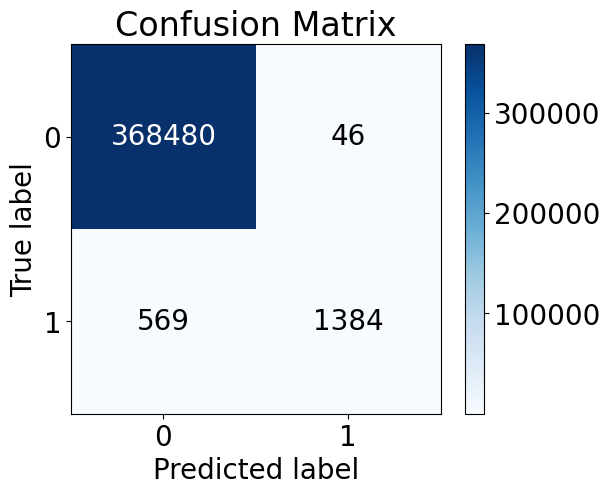

In [ ]:
skplt.metrics.plot_confusion_matrix(y_test,y_pred)

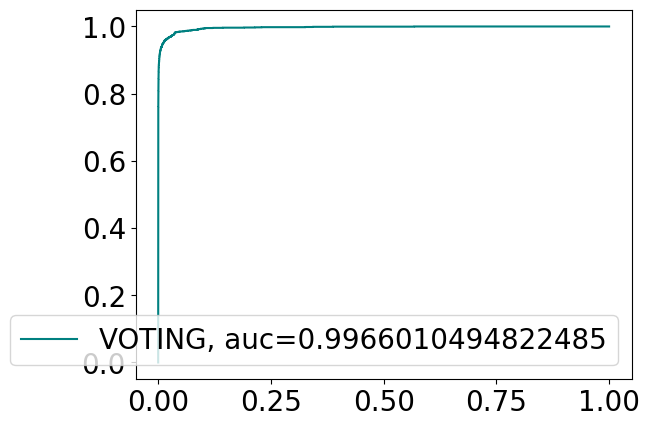

In [ ]:
y_pred_probability_voting = voting.predict_proba(X_test)[::,1]
fpr_voting, tpr_voting, _ = metrics.roc_curve(y_test, y_pred_probability_voting)
voting_auc = metrics.roc_auc_score(y_test, y_pred_probability_voting)
plt.plot(fpr_voting, tpr_voting,color='teal',label="VOTING, auc="+str(voting_auc))
plt.legend(loc=4)
plt.show()

# **SHAP FOR XGBOOST :)**

In [ ]:
 !pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.5/540.5 kB 10.1 MB/s eta 0:00:00


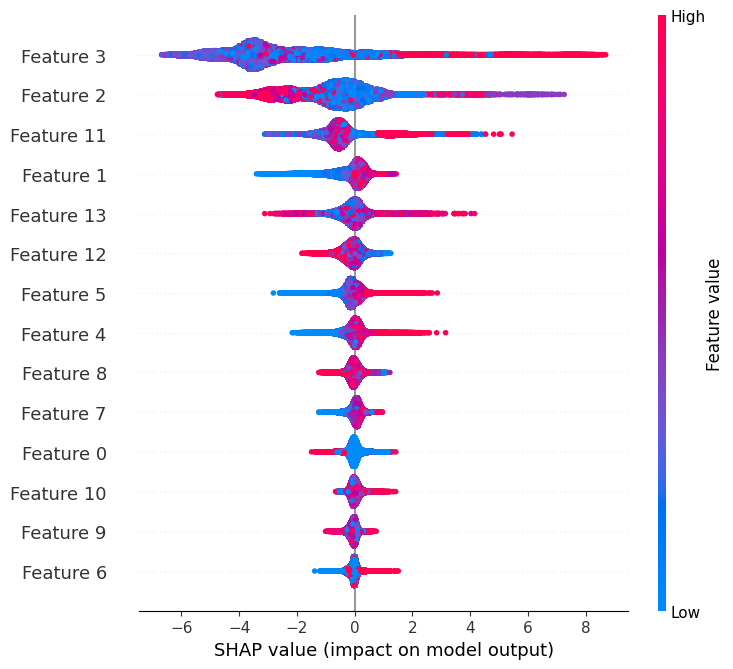

In [ ]:
import shap
XGBmodel1 = xgb.XGBClassifier(objective='binary:logistic').fit(X_train, y_train)
explainer = shap.TreeExplainer(XGBmodel1)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)


Learning rate set to 0.232742
0:	learn: 0.1929929	total: 391ms	remaining: 6m 30s
1:	learn: 0.0652220	total: 899ms	remaining: 7m 28s
2:	learn: 0.0299881	total: 1.22s	remaining: 6m 47s
3:	learn: 0.0189021	total: 1.7s	remaining: 7m 2s
4:	learn: 0.0147617	total: 2.03s	remaining: 6m 43s
5:	learn: 0.0124230	total: 2.47s	remaining: 6m 49s
6:	learn: 0.0114427	total: 2.99s	remaining: 7m 4s
7:	learn: 0.0109838	total: 3.51s	remaining: 7m 15s
8:	learn: 0.0105411	total: 4.12s	remaining: 7m 33s
9:	learn: 0.0086915	total: 4.76s	remaining: 7m 51s
10:	learn: 0.0084422	total: 5.42s	remaining: 8m 7s
11:	learn: 0.0083074	total: 6.05s	remaining: 8m 17s
12:	learn: 0.0082229	total: 6.64s	remaining: 8m 24s
13:	learn: 0.0080280	total: 7.23s	remaining: 8m 29s
14:	learn: 0.0077429	total: 7.85s	remaining: 8m 35s
15:	learn: 0.0075726	total: 8.51s	remaining: 8m 43s
16:	learn: 0.0074389	total: 9.26s	remaining: 8m 55s
17:	learn: 0.0074073	total: 9.83s	remaining: 8m 56s
18:	learn: 0.0072312	total: 10.6s	remaining: 9m 

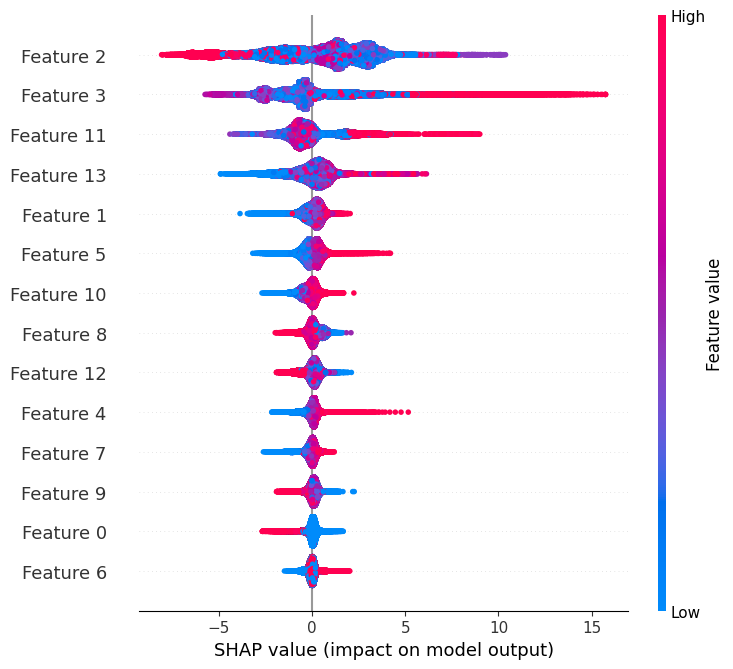

In [ ]:
import shap
from catboost import CatBoostClassifier
Catmodel = CatBoostClassifier().fit(X_train, y_train)
explainer = shap.TreeExplainer(Catmodel )
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

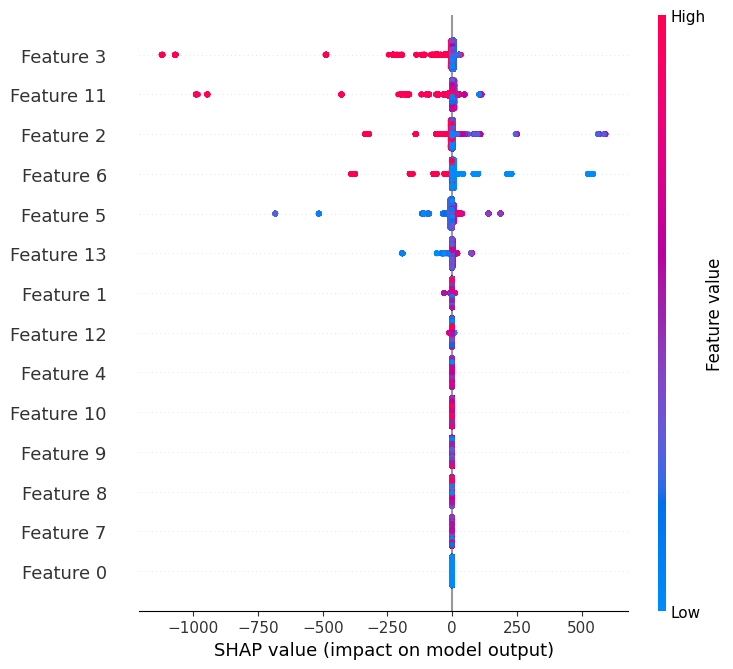

In [ ]:
import shap
from sklearn.ensemble import HistGradientBoostingClassifier
Histmodel = HistGradientBoostingClassifier().fit(X_train, y_train)
explainer = shap.TreeExplainer(Histmodel)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

[LightGBM] [Info] Number of positive: 7698, number of negative: 1474217
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.110081 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 1481915, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.005195 -> initscore=-5.254922
[LightGBM] [Info] Start training from score -5.254922


/usr/local/lib/python3.10/dist-packages/shap/explainers/_tree.py:448: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn('LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray')


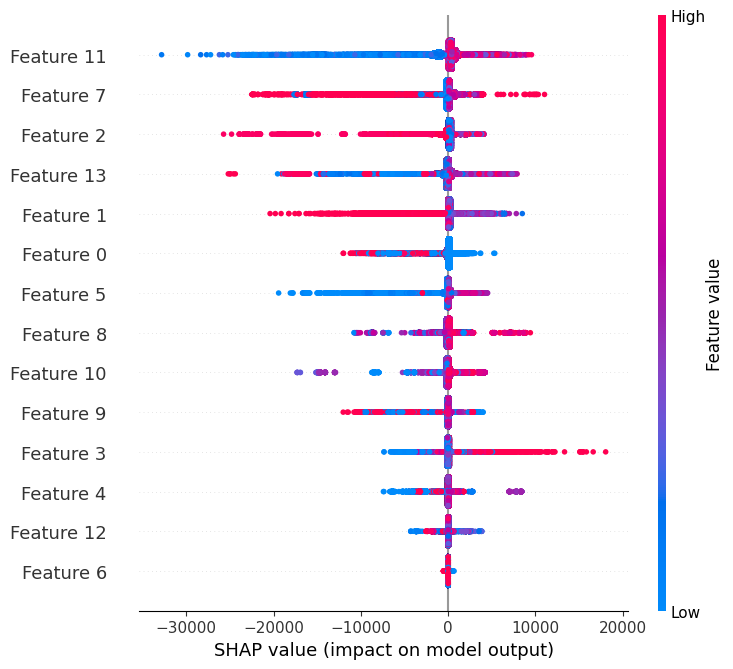

In [ ]:
import shap
import lightgbm as lgb
LGBmodel = lgb.LGBMClassifier(objective='binary').fit(X_train, y_train)
explainer = shap.TreeExplainer(LGBmodel)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

In [ ]:
fraud_df = bcfd_dp[bcfd_dp['is_fraud'] == 1]

In [ ]:
fraud_df

,cc_num,merchant,category,amt,first,last,gender,lat,long,merch_lat,merch_long,is_fraud,hour,month,age
2449,4613314721966,0.709887,0.894448,281.06,0.132455,-0.605847,1,35.9946,-81.7266,36.430124,-81.179483,1,1,1,36
2472,340187018810220,0.004982,-0.238221,11.52,0.409955,0.675658,0,29.4400,-98.4590,29.819364,-99.142791,1,1,1,64
2523,340187018810220,0.836270,0.894448,276.31,0.409955,0.675658,0,29.4400,-98.4590,29.273085,-98.836360,1,3,1,64
2546,4613314721966,-0.164096,-0.238221,7.03,0.132455,-0.605847,1,35.9946,-81.7266,35.909292,-82.091010,1,3,1,36
2553,340187018810220,0.892996,0.894448,275.73,0.409955,0.675658,0,29.4400,-98.4590,29.786426,-98.683410,1,3,1,64
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
517197,2242176657877538,-0.044514,0.198762,1041.51,0.506353,1.878945,1,34.6323,-89.8855,34.573471,-89.911011,1,22,12,65
517274,2242176657877538,0.764512,0.198762,868.09,0.506353,1.878945,1,34.6323,-89.8855,34.091227,-90.390612,1,22,12,65
517341,2242176657877538,1.314485,1.128510,1039.42,0.506353,1.878945,1,34.6323,-89.8855,34.628434,-90.284780,1,22,12,65
517529,2242176657877538,0.812740,0.894448,289.27,0.506353,1.878945,1,34.6323,-89.8855,34.746063,-90.401093,1,23,12,65


In [ ]:
bcfd_dp.head()

,cc_num,merchant,category,amt,first,last,gender,lat,long,merch_lat,merch_long,is_fraud,hour,month,age
0,2703186189652095,1.006109,0.925860,4.97,0.134123,-0.241661,0,36.0788,-81.1781,36.011293,-82.048315,0,0,1,36
1,630423337322,0.676459,0.894448,107.23,0.036022,-0.354978,0,48.8878,-118.2105,49.159047,-118.186462,0,0,1,46
2,38859492057661,-0.834274,-0.872388,220.11,0.165290,0.285653,1,42.1808,-112.2620,43.150704,-112.154481,0,0,1,62
3,3534093764340240,-0.666344,-0.238221,45.00,0.339284,0.312353,1,46.2306,-112.1138,47.034331,-112.561071,0,0,1,57
4,375534208663984,-0.402499,-0.613751,41.96,-0.165204,0.470864,1,38.4207,-79.4629,38.674999,-78.632459,0,0,1,38
